In [1]:
### Hybrid data between the sources Jhon Hopking and Nychealth.

### step 1: reading all files avalaible to do the merge sources. 
import numpy as np
import pandas as pd

PATHJH = 'C:/Users/abarr/Documents/GitHub/PoC-NY-data/output/JHopkins/'
PATHNYT = 'C:/Users/abarr/Documents/GitHub/PoC-NY-data/output/NYTimes/'
PATHNYC = 'C:/Users/abarr/Documents/GitHub/PoC-NY-data/output/NYChealth/historical/'

JH = pd.read_csv(PATHJH + 'JHraw_epidemiology_NY_std.csv')
NYT = pd.read_csv(PATHNYT + 'NYTraw_epidemiology_NY_std.csv')
nyc_hboro = pd.read_csv(PATHNYC + 'NYChealthraw_epidemiology_BOROUGT_std.csv')
nyc_h = pd.read_csv(PATHNYC + 'NYChealthraw_epidemiology_NYC_std.csv')

In [2]:
## checking the files.
## Step 2: Description by columns of each file available. 
## 1) JH file: cumulative count of each counties of NY. cases, deaths active and recovered. 
## 2) NYT file: cumulative count of each counties of NY. cases and deaths.
## 3) nyc_hboro: daily count of each borough of nyc. daily_cases, daily_hospitalized, daily_deaths
## 4) nyc_h: daily count of nyc. daily_cases, daily_hospitalized, daily_deaths. 
display(JH)
display(NYT) ### there is no division per borough
display(nyc_hboro)
display(nyc_h)

,date,fips,county,cases,deaths,active,recovered
0,2020-03-22,36001,Albany,123,0,123,0
1,2020-03-22,36003,Allegany,2,0,2,0
2,2020-03-22,36005,Bronx,0,0,0,0
3,2020-03-22,36007,Broome,3,1,2,0
4,2020-03-22,36009,Cattaraugus,0,0,0,0
...,...,...,...,...,...,...,...
18107,2020-12-29,36123,Yates,473,10,463,365
18108,2020-12-29,36061,New York,59804,3323,56481,49210
18109,2020-12-29,99999,New York City,421811,24956,396855,346631
18110,2020-12-29,36089,St. Lawrence,1948,41,1907,1331


,date,fips,county,cases,deaths
0,2020-03-01,36001,Albany,0,0
1,2020-03-01,36003,Allegany,0,0
2,2020-03-01,36007,Broome,0,0
3,2020-03-01,36009,Cattaraugus,0,0
4,2020-03-01,36011,Cayuga,0,0
...,...,...,...,...,...
17931,2020-12-29,36121,Wyoming,1277,19
17932,2020-12-29,36123,Yates,473,10
17933,2020-12-29,36089,St. Lawrence,1948,41
17934,2020-12-29,99999,New York City,422074,25055


,date,fips,county,daily_cases,daily_hospitalized,daily_deaths,daily_cases_avg,daily_hospitalized_avg,daily_deaths_avg
0,2020-02-29,36005,Bronx,0,0,0,0,0,0
1,2020-03-01,36005,Bronx,0,0,0,0,0,0
2,2020-03-02,36005,Bronx,0,0,0,0,0,0
3,2020-03-03,36005,Bronx,0,0,0,0,0,0
4,2020-03-04,36005,Bronx,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
1505,2020-12-22,36085,Richmond,330,22,8,282,19,5
1506,2020-12-23,36085,Richmond,297,23,4,291,20,5
1507,2020-12-24,36085,Richmond,160,9,2,288,19,4
1508,2020-12-25,36085,Richmond,83,15,4,256,18,4


,date,fips,county,daily_cases,daily_hospitalized,daily_deaths,daily_cases_avg,daily_hospitalized_avg,daily_deaths_avg
0,2020-02-29,99999,New York City,1,0,0,0,0,0
1,2020-03-01,99999,New York City,0,0,0,0,0,0
2,2020-03-02,99999,New York City,0,0,0,0,0,0
3,2020-03-03,99999,New York City,1,1,0,0,0,0
4,2020-03-04,99999,New York City,5,2,0,0,0,0
...,...,...,...,...,...,...,...,...,...
297,2020-12-22,99999,New York City,3772,241,42,2911,232,35
298,2020-12-23,99999,New York City,3336,262,29,2999,242,33
299,2020-12-24,99999,New York City,2643,240,24,3112,247,32
300,2020-12-25,99999,New York City,878,231,23,2770,245,30


In [3]:
## Step 3: Make cumulative data of cases and death from nychealth 

nyc_hboro_hosp_deaths=nyc_hboro[['date','fips','county','daily_cases','daily_hospitalized','daily_deaths']].copy()

nyc_hboro_cum=pd.DataFrame()
k=0
grupos_cnty=nyc_hboro_hosp_deaths.groupby('county')
for name, data in grupos_cnty:
    data['cases']=data['daily_cases'].cumsum()
    data['hospitalized']=data['daily_hospitalized'].cumsum()
    data['deaths']=data['daily_deaths'].cumsum()
    if k==0:
        nyc_hboro_cum=data ### common start date.
    else:
        nyc_hboro_cum=pd.concat([nyc_hboro_cum, data], axis=0)
    k +=1 

### Explication: nyc_hboro_cum includes three new columns with cumulative 
###              confirmed cases, cumulative deaths and cumulative hospitalized to each borough of nyc.
###              It starts from 2020-03-22.

nyc_h['cases']=nyc_h['daily_cases'].cumsum()
nyc_h['hospitalized']=nyc_h['daily_hospitalized'].cumsum()
nyc_h['deaths']=nyc_h['daily_deaths'].cumsum()
nyc_hboro_cum=pd.concat([nyc_hboro_cum,nyc_h[['date','fips','county','daily_cases','daily_hospitalized',
                                              'daily_deaths','cases','hospitalized','deaths']]], axis=0)
display(nyc_hboro_cum)



,date,fips,county,daily_cases,daily_hospitalized,daily_deaths,cases,hospitalized,deaths
0,2020-02-29,36005,Bronx,0,0,0,0,0,0
1,2020-03-01,36005,Bronx,0,0,0,0,0,0
2,2020-03-02,36005,Bronx,0,0,0,0,0,0
3,2020-03-03,36005,Bronx,0,0,0,0,0,0
4,2020-03-04,36005,Bronx,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
297,2020-12-22,99999,New York City,3772,241,42,364395,65937,20095
298,2020-12-23,99999,New York City,3336,262,29,367731,66199,20124
299,2020-12-24,99999,New York City,2643,240,24,370374,66439,20148
300,2020-12-25,99999,New York City,878,231,23,371252,66670,20171


In [4]:
## Step 4: Reorganize databases and unify by dates. jh and nyt.
### Explication: The organizing process consists of sorting 
###              the databases by counties and deleting the data before 2020-03-22. 
### NOTE: The JH database starts the day 2020-03-22.

cnty=np.unique(JH['county'].values)
cnty_nyc=['Bronx','Kings','New York','Queens','Richmond','New York City']
JH_rogze=pd.DataFrame()
JH_Fboro=pd.DataFrame()
NYT_rogze=pd.DataFrame()
NYT_Fboro=pd.DataFrame()

k=0
for i in range(0,len(cnty)):
    onecnty=JH[JH.county==cnty[i]]
    if k==0:
        JH_rogze=onecnty.copy()
    else:
        JH_rogze=pd.concat([JH_rogze,onecnty],axis=0)
    k +=1
    
for i in range(0, len(cnty_nyc)):
    onecnty_nyc=JH[JH.county==cnty_nyc[i]]
    if k==0:
        JH_Fboro=onecnty_nyc.copy()
    else:
        JH_Fboro=pd.concat([JH_Fboro,onecnty_nyc],axis=0)
    k +=1



display(JH_rogze)
display(JH_Fboro)

,date,fips,county,cases,deaths,active,recovered
0,2020-03-22,36001,Albany,123,0,123,0
64,2020-03-23,36001,Albany,127,0,127,0
128,2020-03-24,36001,Albany,146,0,146,0
192,2020-03-25,36001,Albany,152,0,152,0
256,2020-03-26,36001,Albany,171,0,171,0
...,...,...,...,...,...,...,...
17851,2020-12-25,36123,Yates,431,10,421,342
17915,2020-12-26,36123,Yates,447,10,437,346
17979,2020-12-27,36123,Yates,450,10,440,352
18043,2020-12-28,36123,Yates,462,10,452,362


,date,fips,county,cases,deaths,active,recovered
2,2020-03-22,36005,Bronx,0,0,0,0
66,2020-03-23,36005,Bronx,0,0,0,0
130,2020-03-24,36005,Bronx,0,0,0,0
194,2020-03-25,36005,Bronx,0,0,0,0
258,2020-03-26,36005,Bronx,0,0,0,0
...,...,...,...,...,...,...,...
17853,2020-12-25,99999,New York City,409642,24819,384823,332266
17917,2020-12-26,99999,New York City,413914,24849,389065,336274
17981,2020-12-27,99999,New York City,417141,24880,392261,340220
18045,2020-12-28,99999,New York City,418525,24915,393610,343982


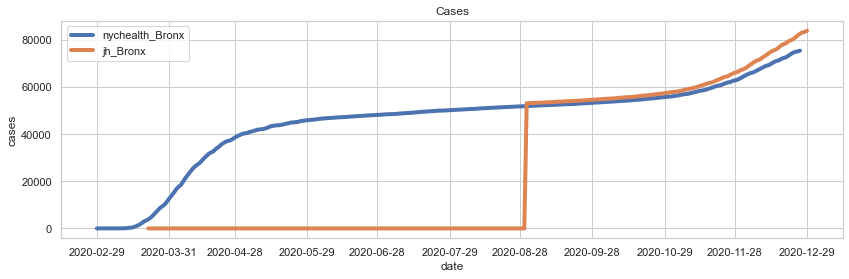

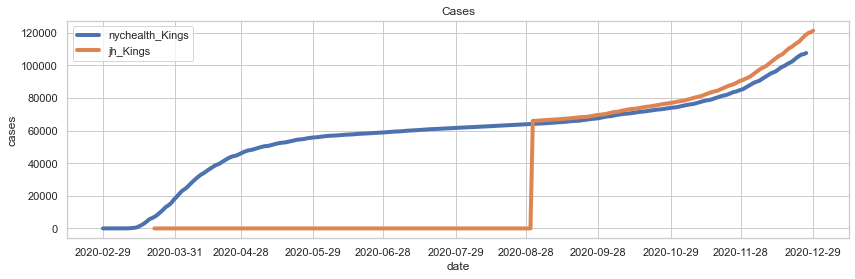

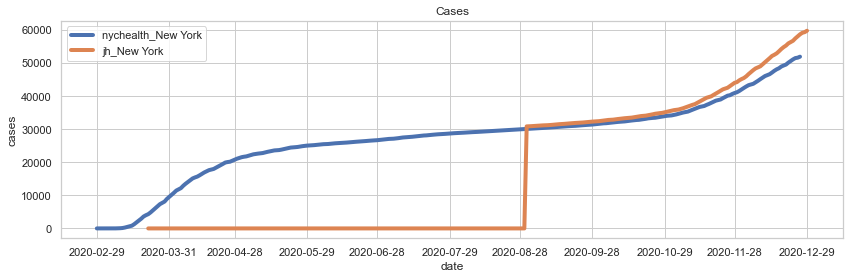

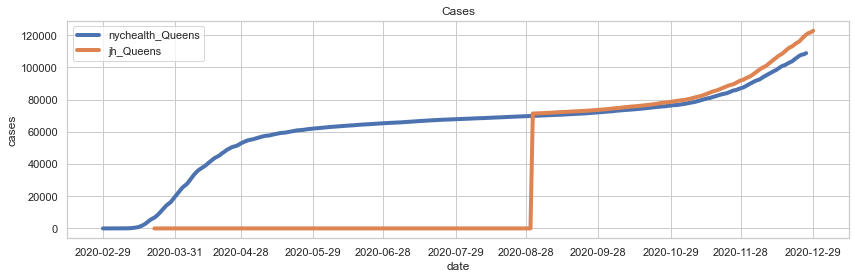

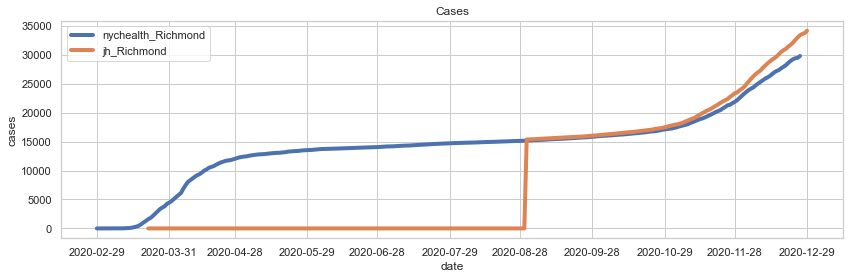

...

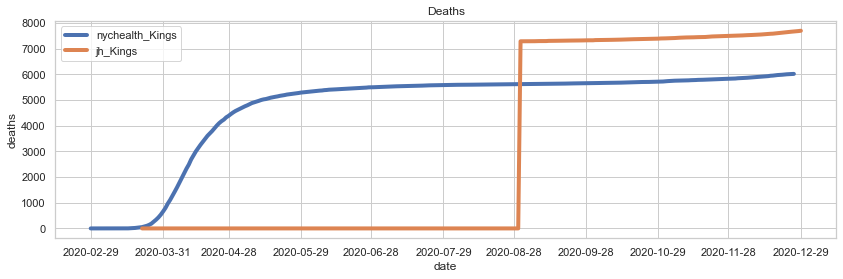

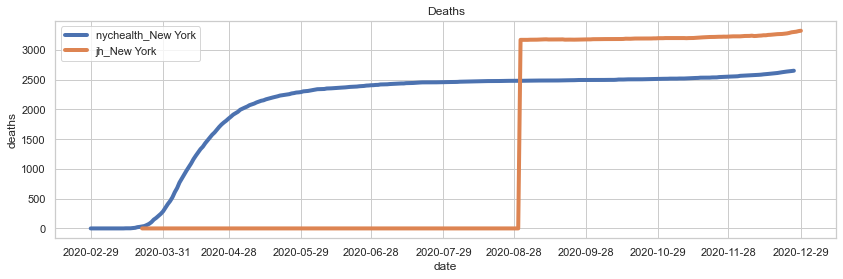

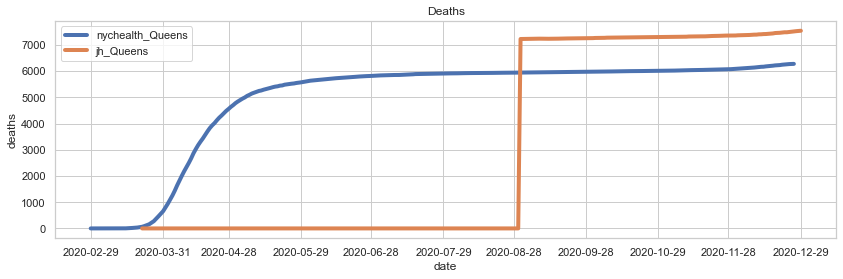

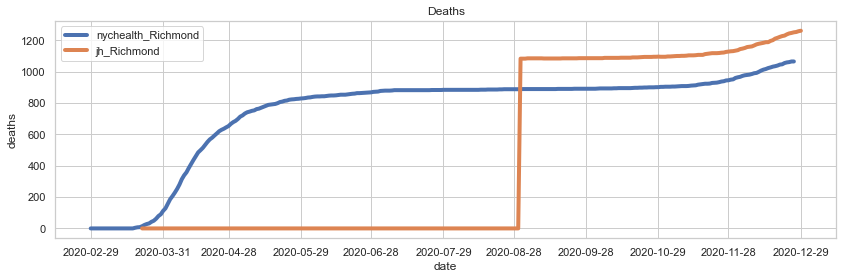

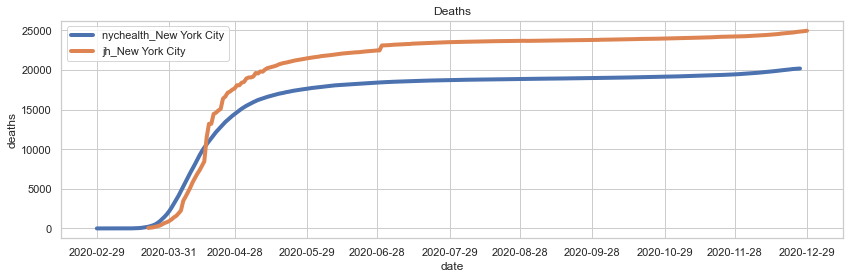

In [5]:
## Step 5: plot data for the 5 boroughs from the JH and nychealth sources and inspect 
##         the data for the other counties.
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter

cnty_nyc=['Bronx','Kings','New York','Queens','Richmond','New York City']
JH_Fboro.index=JH_Fboro['date']
JH_Fboro=JH_Fboro.drop(['date'], axis=1)

nyc_hboro_cum.index=nyc_hboro_cum['date']
nyc_hboro_cum=nyc_hboro_cum.drop(['date'], axis=1)

for i in range(0,len(cnty_nyc)):
    nycjhboro=JH_Fboro[JH_Fboro.county==cnty_nyc[i]]['cases']
    nychealthboro=nyc_hboro_cum[nyc_hboro_cum.county==cnty_nyc[i]]['cases']
    
    sns.set_theme(style="whitegrid")
    fig = plt.figure(figsize=[14, 4])
    ax = fig.add_subplot(111)
    sns.lineplot(data=nychealthboro, palette="tab10", linewidth=4,
                label='nychealth_' + cnty_nyc[i])
    sns.lineplot(data=nycjhboro, palette="tab10", linewidth=4,
                label='jh_' + cnty_nyc[i])
    ax.xaxis.set_major_locator(MonthLocator())
    plt.title('Cases')
    plt.legend()
    plt.show()
    
for i in range(0,len(cnty_nyc)):
    nycjhboro=JH_Fboro[JH_Fboro.county==cnty_nyc[i]]['deaths']
    nychealthboro=nyc_hboro_cum[nyc_hboro_cum.county==cnty_nyc[i]]['deaths']
    
    sns.set_theme(style="whitegrid")
    fig = plt.figure(figsize=[14, 4])
    ax = fig.add_subplot(111)
    sns.lineplot(data=nychealthboro, palette="tab10", linewidth=4,
                label='nychealth_' + cnty_nyc[i])
    sns.lineplot(data=nycjhboro, palette="tab10", linewidth=4,
                label='jh_' + cnty_nyc[i])
    ax.xaxis.set_major_locator(MonthLocator())
    plt.title('Deaths')
    plt.legend()
    plt.show()
    

,date,fips,county,cases,deaths,active,recovered
0,2020-03-22,36001,Albany,123,0,123,0
64,2020-03-23,36001,Albany,127,0,127,0
128,2020-03-24,36001,Albany,146,0,146,0
192,2020-03-25,36001,Albany,152,0,152,0
256,2020-03-26,36001,Albany,171,0,171,0
...,...,...,...,...,...,...,...
17851,2020-12-25,36123,Yates,431,10,421,342
17915,2020-12-26,36123,Yates,447,10,437,346
17979,2020-12-27,36123,Yates,450,10,440,352
18043,2020-12-28,36123,Yates,462,10,452,362


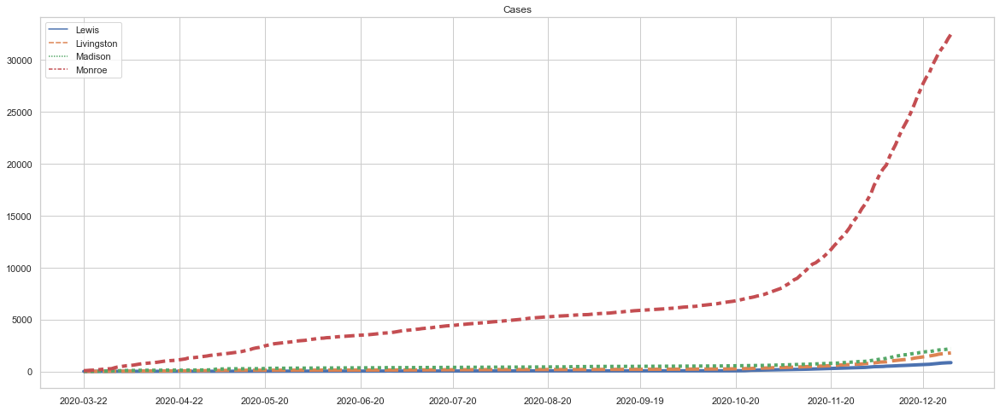

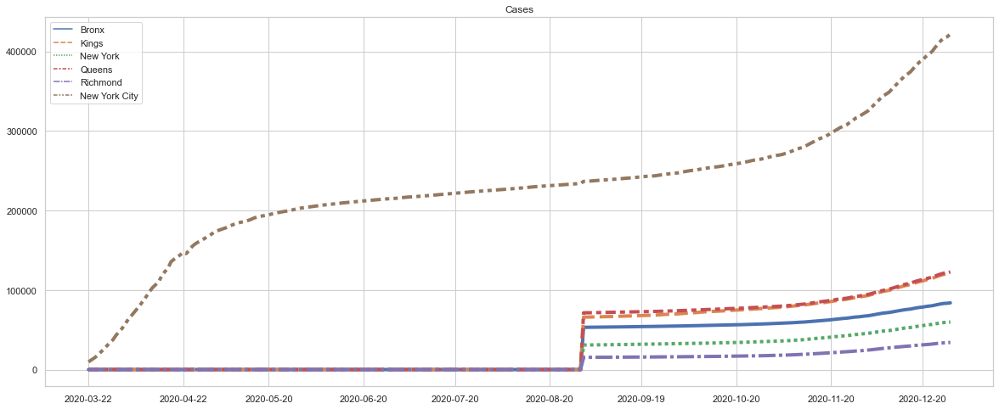

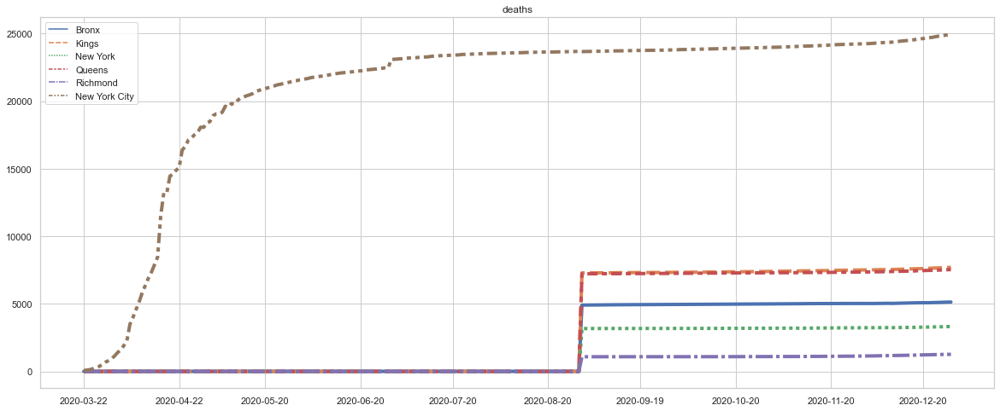

In [6]:
display(JH_rogze)
JH_viscases=pd.DataFrame(index=np.unique(JH_rogze['date'].values), columns=np.unique(JH_rogze['county'].values))
JH_visdeaths=pd.DataFrame(index=np.unique(JH_rogze['date'].values), columns=np.unique(JH_rogze['county'].values))
for i in range(0,len(np.unique(JH_rogze['county'].values))):
    JH_viscases[JH_viscases.columns[i]]=JH_rogze[JH_rogze.county==JH_viscases.columns[i]]['cases'].values
    JH_visdeaths[JH_viscases.columns[i]]=JH_rogze[JH_rogze.county==JH_viscases.columns[i]]['deaths'].values
     
counties=['Bronx','Kings','New York','Queens','Richmond','New York City']
#JH_viscases=JH_viscases.drop(counties, axis=1)
#JH_visdeaths=JH_visdeaths.drop(counties, axis=1)
#JH_viscases.columns[24:28]

sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=JH_viscases[JH_viscases.columns[24:28]], linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
plt.title("Cases")
plt.show()   


sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=JH_viscases[counties], linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
plt.title("Cases")
plt.show()   

sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=JH_visdeaths[counties], linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
plt.title("deaths")
plt.show()   


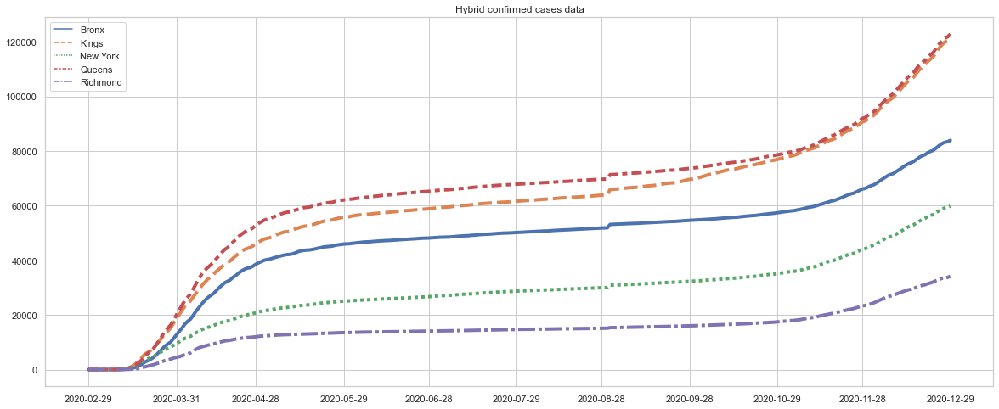

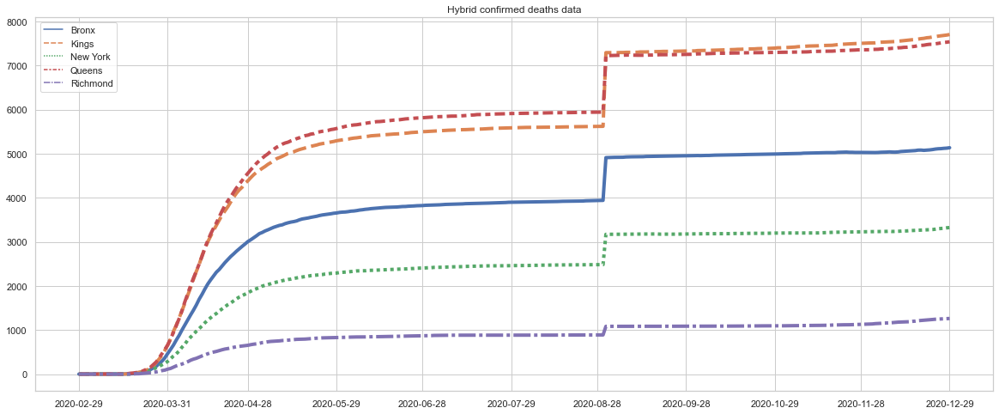

In [7]:
## Step 6: HYBRID DATA: joining data JH and NYC-health for the five boroughs of nyc then 
##                      we merge hybrid data with JH data of the other counties

import datetime
counties=['Bronx','Kings','New York','Queens','Richmond']
jh_dates=[] ## Stores the date of the day JH started the case count for each borough.
jh_dates_death=[]

for i in range(0, len(counties)):
    jh_dates.append(JH_Fboro[(JH_Fboro.county==counties[i]) & 
                             (JH_Fboro.cases == 0)].index[-1])
    jh_dates_death.append(JH_Fboro[(JH_Fboro.county==counties[i]) & (JH_Fboro.deaths == 0)].index[-1])

## HYBRIDATION: hybrid confirmed cases data & hybrid deaths data 

hybriddat_boro=pd.DataFrame()

day=datetime.datetime(pd.to_datetime(jh_dates[0]).year,
                     pd.to_datetime(jh_dates[0]).month,
                     pd.to_datetime(jh_dates[0]).day+1).strftime('%Y-%m-%d')

k = 0
for i in range(0,len(counties)):
    nychealthboro = nyc_hboro_cum[nyc_hboro_cum.county==counties[i]].loc[nyc_hboro_cum.index[0]:jh_dates[0]]
    nycjhboro = JH_Fboro[JH_Fboro.county==counties[i]].loc[day:]
    hybrid = pd.concat([nychealthboro, nycjhboro], axis=0)
    
    if k==0: 
        hybriddat_boro=hybrid.copy()
    else:
        hybriddat_boro=pd.concat([hybriddat_boro, hybrid], axis=0)
        
    k +=1

hybrid_boro=hybriddat_boro[['fips', 'county', 'cases', 'deaths']] ## It is hybrid data!. 

dataset_hybrid_cases = pd.DataFrame(index=np.unique(hybrid_boro.index), columns=counties)
dataset_hybrid_deaths = pd.DataFrame(index=np.unique(hybrid_boro.index), columns=counties)
for i in range(0,5):
    dataset_hybrid_cases[counties[i]]=hybrid_boro[hybrid_boro.county==counties[i]]['cases'].values
    dataset_hybrid_deaths[counties[i]]=hybrid_boro[hybrid_boro.county==counties[i]]['deaths'].values
   
#display(dataset_hybrid_cases)
#display(dataset_hybrid_deaths)
sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=dataset_hybrid_cases, linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
#ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.title("Hybrid confirmed cases data")
plt.show()

sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=dataset_hybrid_deaths, linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
#ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.title("Hybrid confirmed deaths data")
plt.show()

In [8]:
#display(JH_rogze[JH_rogze.county=='New York City'])
#display(hybrid_boro)

def merge(Hyboro, JH_rogze):
    Hyboro=Hyboro.reset_index()
    hybrid_ny=pd.DataFrame(columns=['date', 'fips', 'county', 'cases', 'deaths'])
    counties=['Bronx','Kings','New York','Queens','Richmond']
    
    all_cnties=np.unique(JH_rogze['county'].values)
    k=0
    for i in range(0,len(all_cnties)):
        cty=all_cnties[i]
        aux= cty in counties
        if aux==False:
            if k==0:
                hybrid_ny=JH_rogze[JH_rogze.county==cty][['date', 'fips', 'county', 'cases', 'deaths']].copy()
            else:
                hybrid_ny=pd.concat([hybrid_ny, JH_rogze[JH_rogze.county==cty][['date', 'fips', 'county', 'cases', 'deaths']].copy()], axis=0)
            
            k +=1    
        
        else:
            if k==0:
                hybrid_ny=Hyboro[Hyboro.county==cty][['date', 'fips', 'county', 'cases', 'deaths']].copy()
            else:
                hybrid_ny=pd.concat([hybrid_ny, Hyboro[Hyboro.county==cty][['date', 'fips', 'county', 'cases', 'deaths']].copy()], axis=0)
            
            k +=1

    return hybrid_ny

hybny=merge(hybrid_boro, JH_rogze)

display(hybny)

,date,fips,county,cases,deaths
0,2020-03-22,36001,Albany,123,0
64,2020-03-23,36001,Albany,127,0
128,2020-03-24,36001,Albany,146,0
192,2020-03-25,36001,Albany,152,0
256,2020-03-26,36001,Albany,171,0
...,...,...,...,...,...
17851,2020-12-25,36123,Yates,431,10
17915,2020-12-26,36123,Yates,447,10
17979,2020-12-27,36123,Yates,450,10
18043,2020-12-28,36123,Yates,462,10


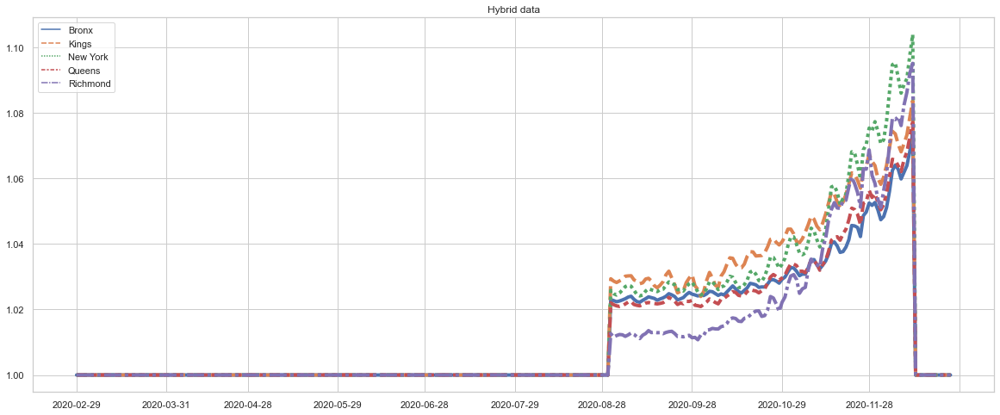

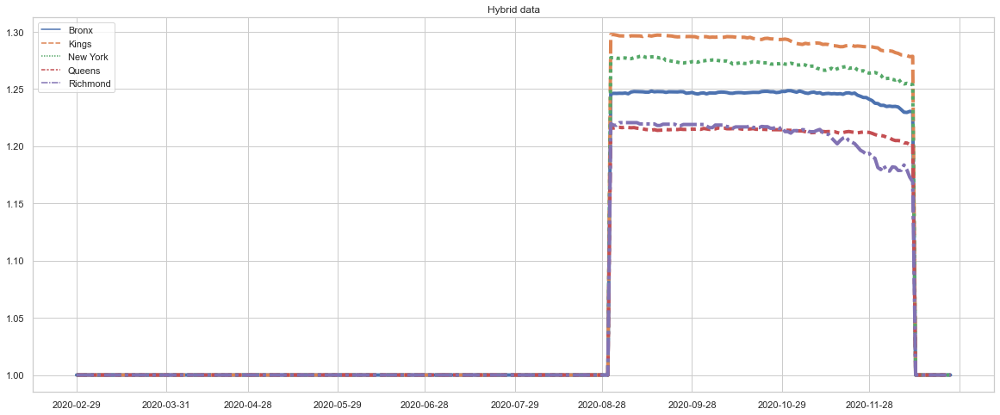

,date,fips,county,cases,deaths
date,,,,,
2020-03-22,2020-03-22,36001,Albany,123,0
2020-03-23,2020-03-23,36001,Albany,127,0
2020-03-24,2020-03-24,36001,Albany,146,0
2020-03-25,2020-03-25,36001,Albany,152,0
2020-03-26,2020-03-26,36001,Albany,171,0
...,...,...,...,...,...
2020-12-25,2020-12-25,36123,Yates,431,10
2020-12-26,2020-12-26,36123,Yates,447,10
2020-12-27,2020-12-27,36123,Yates,450,10


In [9]:
## Step 7: Compare errors on data of the five borough and decide on NYC data.
### nyc_hboro_cum & hybny
hybny.index=hybny['date']
#hybny=hybny.drop(['date'], axis=1)

counties=['Bronx','Kings','New York','Queens','Richmond']
comparison_cases=pd.DataFrame(index=np.unique(nyc_hboro_cum.index), columns=counties)
comparison_deaths=pd.DataFrame(index=np.unique(nyc_hboro_cum.index), columns=counties)
for i in range(0,len(counties)):
    comparison_cases[counties[i]]=hybny[hybny.county==counties[i]]['cases'].loc['2020-02-29':'2020-12-13']/nyc_hboro_cum[nyc_hboro_cum.county==counties[i]]['cases']
    comparison_deaths[counties[i]]=hybny[hybny.county==counties[i]]['deaths'].loc['2020-02-29':'2020-12-13']/nyc_hboro_cum[nyc_hboro_cum.county==counties[i]]['deaths']
    
    comparison_cases[counties[i]] = comparison_cases[counties[i]].fillna(1)
    comparison_deaths[counties[i]] = comparison_deaths[counties[i]].fillna(1)
    

sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=comparison_cases, linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
plt.title("Hybrid data")
plt.show()

sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111)
sns.lineplot(data=comparison_deaths, linewidth=4)
ax.xaxis.set_major_locator(MonthLocator())
plt.title("Hybrid data")
plt.show()

display(hybny)
#display(nyc_hboro_cum)

In [10]:
## Step 8: Apply polynomial regression, add edge condition and choose degree of polynomial.
### Calculate the normalization of the cummulated cases and deaths of HYBRID source using Z-score method
import pdb
###hybny
listNY_cty=np.unique(hybny['county'].to_list())
hybny.reset_index(inplace = True, drop = True)
HZdf = pd.DataFrame(columns=['date', 'fips', 'county', 'cases', 'deaths'])

k=0
for cty in listNY_cty:
    Zscor_cty=pd.DataFrame(columns=['date', 'fips', 'county', 'cases', 'deaths'])
    aux=hybny[hybny.county == cty].copy()
    
    mean_aux_c = aux['cases'].mean()
    std_aux_c = aux['cases'].std()
    numerador_c = aux['cases'] - mean_aux_c
    
    #pdb.set_trace()
    Zscor_cty['date']=aux['date'].copy()
    Zscor_cty['fips']=aux['fips'].copy()
    Zscor_cty['county']=aux['county'].copy()
    Zscor_cty['cases']=numerador_c.div(std_aux_c)
    
    Zscor_cty['cases_not_norm']=aux['cases'].values
    
    mean_aux_d = aux['deaths'].mean()
    std_aux_d = aux['deaths'].std()
    numerador_d = aux['deaths'] - mean_aux_d
    
    Zscor_cty['deaths']=numerador_d.div(std_aux_d)
    
    Zscor_cty['deaths_not_norm']=aux['deaths'].values
    
    if k==0:
        HZdf = Zscor_cty.copy()
    else:
        HZdf = pd.concat([HZdf, Zscor_cty], axis = 0)
        
    k = k+1
    
display(HZdf)

,date,fips,county,cases,deaths,cases_not_norm,deaths_not_norm
0,2020-03-22,36001,Albany,-1.319872,-2.306959,123,0
1,2020-03-23,36001,Albany,-1.318054,-2.306959,127,0
2,2020-03-24,36001,Albany,-1.309419,-2.306959,146,0
3,2020-03-25,36001,Albany,-1.306692,-2.306959,152,0
4,2020-03-26,36001,Albany,-1.298056,-2.306959,171,0
...,...,...,...,...,...,...,...
18217,2020-12-25,36123,Yates,3.065953,1.652145,431,10
18218,2020-12-26,36123,Yates,3.212150,1.652145,447,10
18219,2020-12-27,36123,Yates,3.239562,1.652145,450,10
18220,2020-12-28,36123,Yates,3.349210,1.652145,462,10


In [35]:
from datetime import datetime, timedelta

df_HZdf= HZdf.copy()
##
day1 = df_HZdf.loc[0,'date']
days = (pd.to_datetime(df_HZdf['date']) - pd.to_datetime(day1))/np.timedelta64(1, 's')
days = days/3600/24
x = days.to_numpy()
df_HZdf['days'] = days


In [12]:
#### polynomial regression
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

In [13]:
## Polynomial Regression 
def model(degree, alp):
    model = make_pipeline(PolynomialFeatures(degree), Ridge(alpha=alp, fit_intercept=False))
    return model

def polyreg(df_HZdf, alp, degree):
    idx = df_HZdf[df_HZdf.county=='Unassigned'].index
    df_HZdf.drop(idx, inplace = True)
    HRZ = pd.DataFrame()
    listNY = np.unique(df_HZdf['county'])
    k = 0
    for cty in listNY:
        temp = pd.DataFrame(columns=['date','days','county','cases','fit_cases','deaths','fit_deaths'])
        
        aux = df_HZdf[df_HZdf.county==cty].copy()
        
        d = aux['days'].copy()
        x = d.to_numpy()
        
        X = x[:,np.newaxis]
        y = aux['cases'].to_numpy()
        y_d = aux['deaths'].to_numpy()
        
        
        model_test = model(degree, alp)
        
        model_test.fit(X,y)
        model_test.fit(X,y_d)
        
        y = model_test.predict(X)
        y_d = model_test.predict(X)
        
        scr = model_test.score(X,y)
        scr_d = model_test.score(X,y_d)
        
        temp['date'] = aux['date'].copy()
        temp['days'] = aux['days'].copy()
        temp['county'] = aux['county'].copy()
        temp['cases'] = aux['cases'].copy()
        temp['deaths'] = aux['deaths'].copy()
        temp['fit_cases'] = pd.Series(y).values
        temp['fit_deaths'] = pd.Series(y_d).values
        temp['cases_not_norm'] = aux['cases_not_norm'].copy()
        temp['deaths_not_norm'] = aux['deaths_not_norm'].copy()
        
        if k==0:
            HRZ = temp.copy()
            k = k+1
        else:
            HRZ = pd.concat([HRZ, temp], axis=0)
    
    return HRZ


dfaux = df_HZdf.copy()
dfaux = dfaux.reset_index()
dfaux = dfaux.drop('index', axis=1)
HRZ = polyreg(dfaux,20,3)
display(HRZ)

,date,days,county,cases,fit_cases,deaths,fit_deaths,cases_not_norm,deaths_not_norm
0,2020-03-22,0.0,Albany,-1.319872,-1.395343,-2.306959,-1.395343,123,0
1,2020-03-23,1.0,Albany,-1.318054,-1.380550,-2.306959,-1.380550,127,0
2,2020-03-24,2.0,Albany,-1.309419,-1.365814,-2.306959,-1.365814,146,0
3,2020-03-25,3.0,Albany,-1.306692,-1.351135,-2.306959,-1.351135,152,0
4,2020-03-26,4.0,Albany,-1.298056,-1.336513,-2.306959,-1.336513,171,0
...,...,...,...,...,...,...,...,...,...
18217,2020-12-25,278.0,Yates,3.065953,0.786179,1.652145,0.786179,431,10
18218,2020-12-26,279.0,Yates,3.212150,0.783935,1.652145,0.783935,447,10
18219,2020-12-27,280.0,Yates,3.239562,0.781596,1.652145,0.781596,450,10
18220,2020-12-28,281.0,Yates,3.349210,0.779163,1.652145,0.779163,462,10


In [ ]:
def error(HRZ,alpha,degrees):
    E_cases = pd.DataFrame()
    E_deaths = pd.DataFrame()
    j=0
    
    cties = np.unique(HRZ['county'].values)
    l=0
    for cty in cties:
        cases = pd.DataFrame(columns=['county', 'alpha', 'k', 'Loss', 'L2_norm', 'L1_norm'])
        deaths = pd.DataFrame(columns=['county', 'alpha', 'k', 'Loss', 'L2_norm', 'L1_norm'])
        cases['k'] = degrees
        deaths['k'] = degrees
        cases['county'] = [cty]*len(degrees)
        deaths['county'] = [cty]*len(degrees)

        for alp in alpha:
            cases['alpha'] = [alp]*len(degrees)
            deaths['alpha'] = [alp]*len(degrees)
            
            for d in degrees:
                methodReg = polyreg(HRZ, alp, d)
                
                aux = methodReg[methodReg.county==cty]
                
                vec1 = aux['cases']
                vec2 = aux['deaths']
                L = sum((vec1-aux['fit_cases'].values)**2/len(vec1))
                L_d = sum((vec2-aux['fit_deaths'].values)**2/len(vec2))
                
                L2_norm = np.sum(np.power((vec1-aux['fit_cases'].values),2))
                L2_norm_d = np.sum(np.power((vec2-aux['fit_deaths'].values),2))
                
                L1_norm = np.linalg.norm((vec1-aux['fit_cases'].values), ord=1)
                L1_norm_d = np.linalg.norm((vec2-aux['fit_deaths']), ord=1)
                
                cases.loc[d-2, 'Loss'] = L
                deaths.loc[d-2, 'Loss'] = L_d
                cases.loc[d-2, 'L2_norm'] = L2_norm
                deaths.loc[d-2, 'L2_norm'] = L2_norm_d
                cases.loc[d-2, 'L1_norm'] = L1_norm
                deaths.loc[d-2, 'L1_norm'] = L1_norm_d
            
            
            if l==0:
                E_cases = cases.copy()
                E_deaths = deaths.copy()
                l = l+1
            else:
                E_cases = pd.concat([E_cases,cases], axis=0)
                E_deaths = pd.concat([E_deaths,deaths], axis=0)
        
    return E_cases, E_deaths

              
alpha = [10, 20, 30, 40, 50]   
degrees = [2,3,4,5,6,7,8] 
E=error(HRZ,alpha,degrees)

In [23]:
import pdb

def ToChoose(E):
    ### Choose the best parameters; alpha y k to each county
    cties = np.unique(E[0]['county'].values)
    ### we go through all the counties.
    cty_opt_dat_cases = pd.DataFrame()
    cty_opt_dat_deaths = pd.DataFrame()
    
    k=0
    for cty in cties: 
        
        aux_cases = E[0][E[0].county==cty]
        aux_deaths = E[1][E[1].county==cty]
        
        opt = aux_cases[aux_cases.Loss==aux_cases['Loss'].min()]
        optt = aux_deaths[aux_deaths.Loss==aux_deaths['Loss'].min()]
        
        if k==0:
            cty_opt_dat_cases = opt
            cty_opt_dat_deaths = optt
            k = k+1
        else:
            cty_opt_dat_cases = pd.concat([cty_opt_dat_cases, opt], axis=0)
            cty_opt_dat_deaths = pd.concat([cty_opt_dat_deaths, optt], axis=0)
        
    #pdb.set_trace() 
    return cty_opt_dat_cases, cty_opt_dat_deaths
    
    
param_opt = ToChoose(E)
display(param_opt)

(         county  alpha  k       Loss  L2_norm  L1_norm
 0        Albany     50  2   0.307438  87.0049  117.645
 2      Allegany     10  4  0.0190812  5.39997  33.5298
 1         Bronx     10  3   0.085935  26.2102  73.0075
 1        Broome     10  3  0.0278767   7.8891   37.576
 2   Cattaraugus     10  4  0.0711716  20.1416  63.3609
 ..          ...    ... ..        ...      ...      ...
 1    Washington     10  3   0.502092  142.092  143.789
 3         Wayne     10  5  0.0114548  3.24172  24.1568
 1   Westchester     10  3   0.291557  82.5106  114.259
 3       Wyoming     10  5  0.0729347  20.6405  65.4638
 0         Yates     50  2   0.485866    137.5  151.003
 
 [63 rows x 6 columns],
          county  alpha  k        Loss  L2_norm  L1_norm
 6        Albany     10  8   0.0454528  12.8631  28.8808
 6      Allegany     10  8  0.00636831  1.80223  16.2167
 4         Bronx     10  6   0.0423756  12.9245  37.7941
 6        Broome     10  8   0.0186762  5.28536  21.1271
 6   Cattaraugus 

In [ ]:
### Work with the optimal parameters to each county. 

def OptPoly(param_opt, dfaux):
    cties = param_opt[0]['county'].values
    Result_opt_cty_cases=pd.DataFrame()
    Result_opt_cty_deaths=pd.DataFrame()
    k=0
    for cty in cties: 
        aux_opt_cases = param_opt[0]
        aux_opt_deaths = param_opt[1]
        
        alpha_opt = aux_opt_cases[aux_opt_cases.county==cty]['alpha'].values[0]
        degree_opt = aux_opt_cases[aux_opt_cases.county==cty]['k'].values[0]
        
        alpha_opt_d = aux_opt_deaths[aux_opt_deaths.county==cty]['alpha'].values[0]
        degree_opt_d = aux_opt_deaths[aux_opt_deaths.county==cty]['k'].values[0]
        
        pre_result = polyreg(dfaux, alpha_opt, degree_opt)
        pre_result_d = polyreg(dfaux, alpha_opt_d, degree_opt_d)
        
        result_cty = pre_result[pre_result.county==cty]
        result_cty_d = pre_result_d[pre_result_d.county==cty]
        
        if k==0:
            Result_opt_cty_cases = result_cty
            Result_opt_cty_deaths = result_cty_d
            k = k+1
        else:
            Result_opt_cty_cases = pd.concat([Result_opt_cty_cases, result_cty], axis=0)
            Result_opt_cty_deaths = pd.concat([Result_opt_cty_deaths,result_cty_d], axis=0)
        
    
    ## we tour Result_opt_cty_cases and modify the column fit_deaths.
    cties = np.unique(Result_opt_cty_cases['county'].values)
    
    for cty in cties:
        auxx = Result_opt_cty_cases[Result_opt_cty_cases.county==cty]['fit_deaths'].reset_index()
        idx = auxx['index'].values
        Result_opt_cty_cases[Result_opt_cty_cases.county==cty].loc[idx,'fit_deaths']=Result_opt_cty_deaths[Result_opt_cty_deaths.county==cty]['fit_deaths'].values.copy()
        
    Result_opt_cty = Result_opt_cty_cases.copy()
    
    return Result_opt_cty

Result_reg = OptPoly(param_opt, dfaux)

In [25]:
display(Result_reg)

,date,days,county,cases,fit_cases,deaths,fit_deaths,cases_not_norm,deaths_not_norm
0,2020-03-22,0.0,Albany,-1.319872,-0.871382,-2.306959,-0.871382,123,0
1,2020-03-23,1.0,Albany,-1.318054,-0.864919,-2.306959,-0.864919,127,0
2,2020-03-24,2.0,Albany,-1.309419,-0.858448,-2.306959,-0.858448,146,0
3,2020-03-25,3.0,Albany,-1.306692,-0.851969,-2.306959,-0.851969,152,0
4,2020-03-26,4.0,Albany,-1.298056,-0.845480,-2.306959,-0.845480,171,0
...,...,...,...,...,...,...,...,...,...
18217,2020-12-25,278.0,Yates,3.065953,0.978820,1.652145,0.978820,431,10
18218,2020-12-26,279.0,Yates,3.212150,0.983193,1.652145,0.983193,447,10
18219,2020-12-27,280.0,Yates,3.239562,0.987549,1.652145,0.987549,450,10
18220,2020-12-28,281.0,Yates,3.349210,0.991887,1.652145,0.991887,462,10


In [31]:

def ComeBack(Result_reg):
    df_HRZ = Result_reg.copy()
    ## to each county
    df_HRZ_cb = pd.DataFrame()
    vec = np.unique(df_HRZ['county'].values)
    for i in range(0,len(vec)):
        aux = df_HRZ[df_HRZ.county==vec[i]].copy()
        
        std = aux['cases_not_norm'].std()
        mn = aux['cases_not_norm'].mean()
        
        std_d = aux['deaths_not_norm'].std()
        mn_d = aux['deaths_not_norm'].mean()
        
        aux['fit_cases_ori'] = std*aux['fit_cases'].copy() + mn
        aux['fit_deaths_ori'] = std_d*aux['fit_deaths'].copy() + mn_d
        
        if i == 0:
            df_HRZ_cb = aux.copy()
        else:
            df_HRZ_cb = pd.concat([df_HRZ_cb, aux], axis=0)
    
    return df_HRZ_cb
        
df_HRZ_cb=ComeBack(Result_reg)        
display(df_HRZ_cb)

,date,days,county,cases,fit_cases,deaths,fit_deaths,cases_not_norm,deaths_not_norm,fit_cases_ori,fit_deaths_ori
0,2020-03-22,0.0,Albany,-1.319872,-0.871382,-2.306959,-0.871382,123,0,1109.779346,68.941278
1,2020-03-23,1.0,Albany,-1.318054,-0.864919,-2.306959,-0.864919,127,0,1123.998189,69.251626
2,2020-03-24,2.0,Albany,-1.309419,-0.858448,-2.306959,-0.858448,146,0,1138.236045,69.562390
3,2020-03-25,3.0,Albany,-1.306692,-0.851969,-2.306959,-0.851969,152,0,1152.492915,69.873569
4,2020-03-26,4.0,Albany,-1.298056,-0.845480,-2.306959,-0.845480,171,0,1166.768798,70.185163
...,...,...,...,...,...,...,...,...,...,...,...
18217,2020-12-25,278.0,Yates,3.065953,0.978820,1.652145,0.978820,431,10,202.582362,8.195566
18218,2020-12-26,279.0,Yates,3.212150,0.983193,1.652145,0.983193,447,10,203.060923,8.207284
18219,2020-12-27,280.0,Yates,3.239562,0.987549,1.652145,0.987549,450,10,203.537601,8.218957
18220,2020-12-28,281.0,Yates,3.349210,0.991887,1.652145,0.991887,462,10,204.012397,8.230583


Text(0, 0.5, 'CASES')

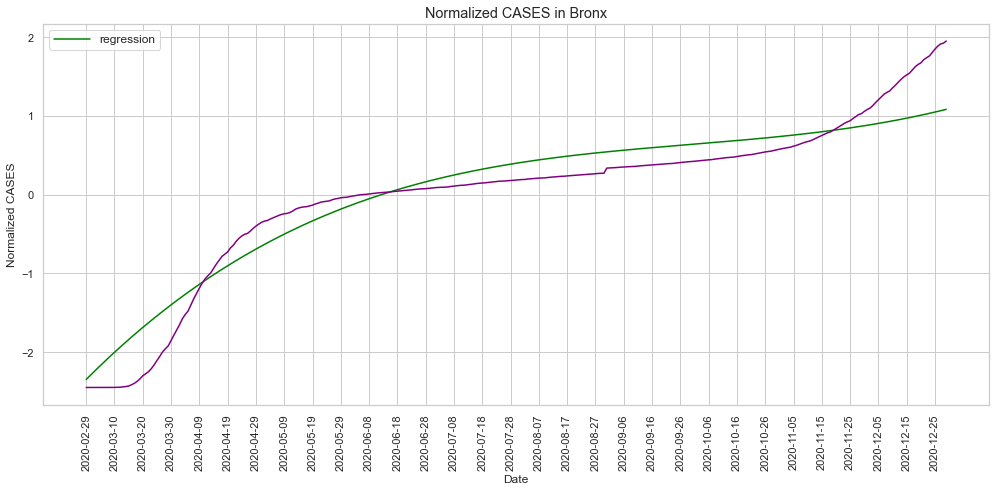

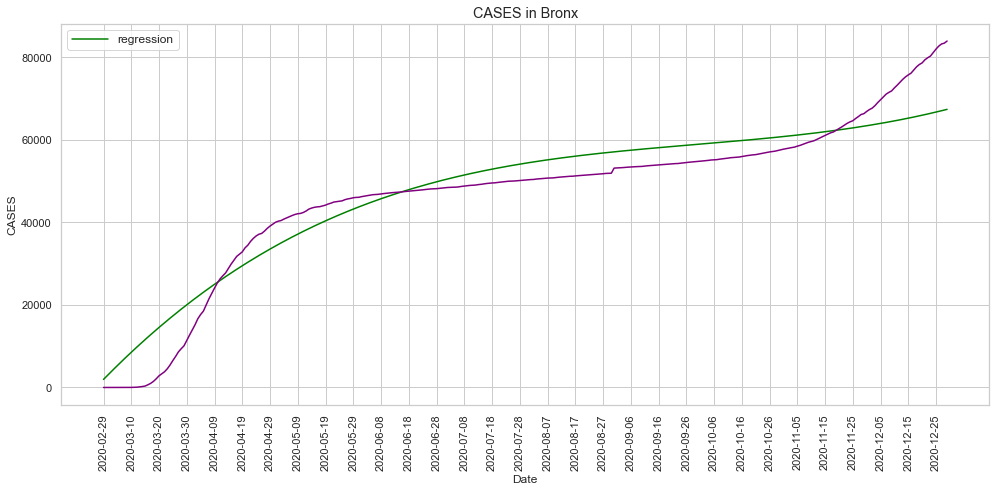

In [44]:
fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))

countyName = 'Bronx'
scale='linear'
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['fit_cases'].loc[df_HRZ_cb['county'] == countyName],color='green')
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['cases'].loc[df_HRZ_cb['county'] == countyName],color='purple')

plt.legend(fontsize='medium', labels=['regression'], handlelength=3.0, loc = 'upper left')


plt.xticks(df_HRZ_cb['date'].loc[df_HZdf['county'] == countyName], rotation='vertical')
ax.set_xticks(ax.get_xticks()[::10])
ax.set_yscale(scale)
#ax.set_ylim(1e2,5e6)
ax.set_title(f'Normalized CASES in ' + countyName, fontsize='large')
ax.set_xlabel(f'Date', fontsize='medium')
ax.set_ylabel(f'Normalized CASES', fontsize='medium')

fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))

countyName = 'Bronx'
scale='linear'
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['fit_cases_ori'].loc[df_HRZ_cb['county'] == countyName],color='green')
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['cases_not_norm'].loc[df_HRZ_cb['county'] == countyName],color='purple')

plt.legend(fontsize='medium', labels=['regression'], handlelength=3.0, loc = 'upper left')


plt.xticks(df_HRZ_cb['date'].loc[df_HZdf['county'] == countyName], rotation='vertical')
ax.set_xticks(ax.get_xticks()[::10])
ax.set_yscale(scale)
#ax.set_ylim(1e2,5e6)
ax.set_title(f'CASES in ' + countyName, fontsize='large')
ax.set_xlabel(f'Date', fontsize='medium')
ax.set_ylabel(f'CASES', fontsize='medium')
        

Text(0, 0.5, 'DEATHS')

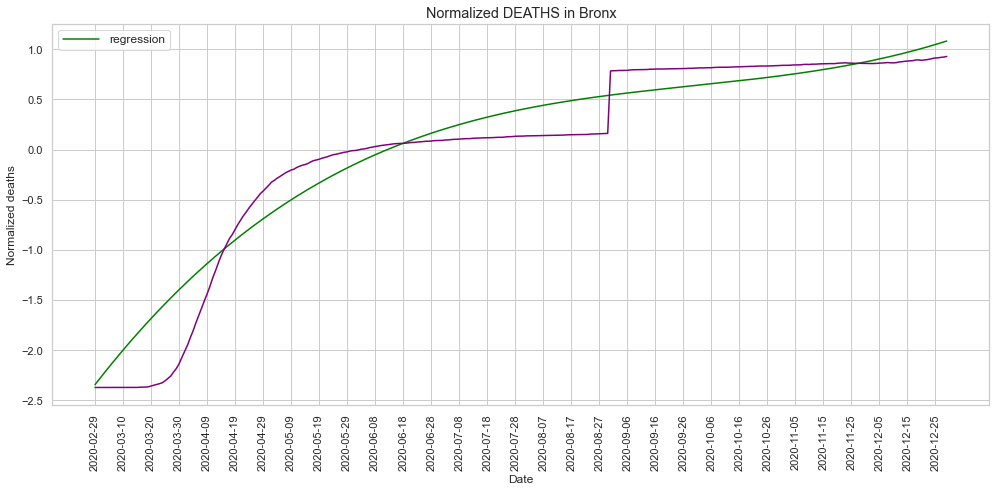

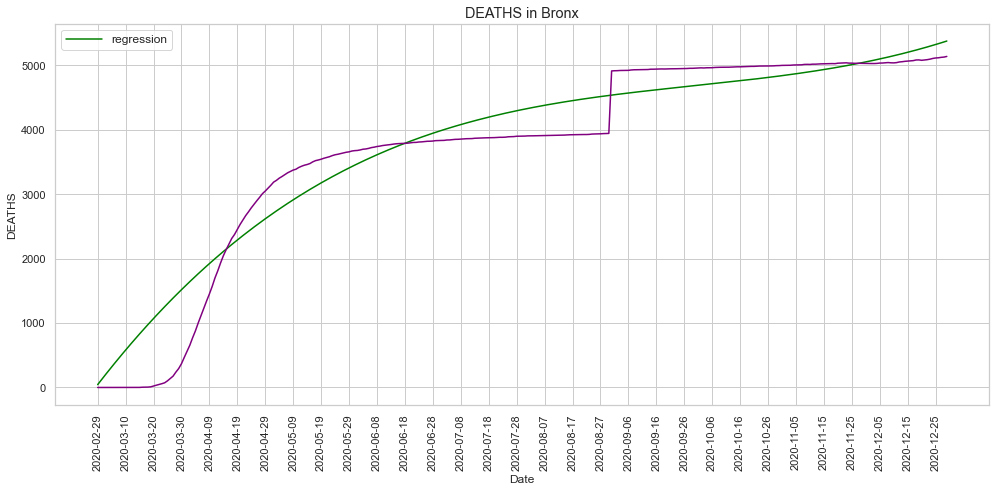

In [45]:
fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))

countyName = 'Bronx'
scale='linear'
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['fit_deaths'].loc[df_HRZ_cb['county'] == countyName],color='green')
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HZdf['deaths'].loc[df_HZdf['county'] == countyName],color='purple')

plt.legend(fontsize='medium', labels=['regression'], handlelength=3.0, loc = 'upper left')


plt.xticks(df_HRZ_cb['date'].loc[df_HZdf['county'] == countyName], rotation='vertical')
ax.set_xticks(ax.get_xticks()[::10])
ax.set_yscale(scale)
#ax.set_ylim(1e2,5e6)
ax.set_title(f'Normalized DEATHS in ' + countyName, fontsize='large')
ax.set_xlabel(f'Date', fontsize='medium')
ax.set_ylabel(f'Normalized deaths', fontsize='medium')

fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))

countyName = 'Bronx'
scale='linear'
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['fit_deaths_ori'].loc[df_HRZ_cb['county'] == countyName],color='green')
ax.plot(df_HRZ_cb['date'].loc[df_HRZ_cb['county'] == countyName], df_HRZ_cb['deaths_not_norm'].loc[df_HRZ_cb['county'] == countyName],color='purple')

plt.legend(fontsize='medium', labels=['regression'], handlelength=3.0, loc = 'upper left')


plt.xticks(df_HRZ_cb['date'].loc[df_HZdf['county'] == countyName], rotation='vertical')
ax.set_xticks(ax.get_xticks()[::10])
ax.set_yscale(scale)
#ax.set_ylim(1e2,5e6)
ax.set_title(f'DEATHS in ' + countyName, fontsize='large')
ax.set_xlabel(f'Date', fontsize='medium')
ax.set_ylabel(f'DEATHS', fontsize='medium')

In [46]:
df_HRZ_cb=df_HRZ_cb.rename(columns={'fit_cases':'fit_cases_Zreg', 'fit_deaths':'fit_deaths_Zreg', 'fit_cases_ori':'fit_cases_Oreg', 'fit_deaths_ori':'fit_deaths_Oreg','cases_not_norm':'cases_wthn','deaths_not_norm':'deaths_wthn'})
vc=np.unique(df_HRZ_cb['county'].values)
display(df_HRZ_cb)

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg
0,2020-03-22,0.0,Albany,-1.319872,-0.871382,-2.306959,-0.871382,123,0,1109.779346,68.941278
1,2020-03-23,1.0,Albany,-1.318054,-0.864919,-2.306959,-0.864919,127,0,1123.998189,69.251626
2,2020-03-24,2.0,Albany,-1.309419,-0.858448,-2.306959,-0.858448,146,0,1138.236045,69.562390
3,2020-03-25,3.0,Albany,-1.306692,-0.851969,-2.306959,-0.851969,152,0,1152.492915,69.873569
4,2020-03-26,4.0,Albany,-1.298056,-0.845480,-2.306959,-0.845480,171,0,1166.768798,70.185163
...,...,...,...,...,...,...,...,...,...,...,...
18217,2020-12-25,278.0,Yates,3.065953,0.978820,1.652145,0.978820,431,10,202.582362,8.195566
18218,2020-12-26,279.0,Yates,3.212150,0.983193,1.652145,0.983193,447,10,203.060923,8.207284
18219,2020-12-27,280.0,Yates,3.239562,0.987549,1.652145,0.987549,450,10,203.537601,8.218957
18220,2020-12-28,281.0,Yates,3.349210,0.991887,1.652145,0.991887,462,10,204.012397,8.230583


In [51]:
### Cubic Spline method
from scipy.interpolate import CubicSpline
import matplotlib.pyplot as plt

dfaux = df_HRZ_cb.copy()
df = dfaux.reset_index()
#dfaux = df.copy()
df = df.drop('index', axis=1)
def CuSpline(dfaux, wdw, wdw_d):
    idx = df_HRZ_cb[df_HRZ_cb.county=='Unassigned'].index
    df_HRZ_cb.drop(idx, inplace = True)    
    vctr = np.unique(df_HRZ_cb['county'].values)
    cub_sp_cties = pd.DataFrame()
    for i in range(0,len(vctr)):
        print('CUBIC SPLINE PROCESSING ' + str(vctr[i]))
        aux = df_HRZ_cb[df_HRZ_cb.county==vctr[i]].reset_index()
        aux = aux.drop(['index'], axis=1)

        idx = [i for i in range(0,len(aux.index)) if i%wdw==0]
        idx_d = [i for i in range(0,len(aux.index)) if i%wdw_d==0]

        if idx[-1]==aux.index[-1]:
            sub_aux = aux.loc[idx]
        else:
            idx.append(aux.index[-1])
            sub_aux=aux.loc[idx]

        if idx_d[-1]==aux.index[-1]:
            sub_aux_d = aux.loc[idx_d]
        else:
            idx_d.append(aux.index[-1])
            sub_aux_d=aux.loc[idx_d]

        xx = aux['days'].values
        yy = aux['cases_wthn'].values
        yy_d = aux['deaths_wthn'].values
        ######
        x = sub_aux['days'].values
        x_d = sub_aux_d['days'].values

        y = sub_aux['cases_wthn'].values
        y_d = sub_aux_d['deaths_wthn'].values

        cs = CubicSpline(x,y)
        cs_d = CubicSpline(x_d,y_d)

        aux['fit_cases_sp']=cs(xx)
        aux['fit_deaths_sp']=cs_d(xx)

        if i==0:
            cub_sp_cties = aux.copy()
        else:
            cub_sp_cties = pd.concat([cub_sp_cties, aux], axis=0)

    return cub_sp_cties 


In [ ]:
def error(df,W):
    idx = df[df.county=='Unassigned'].index
    df.drop(idx, inplace = True)
    Error = pd.DataFrame()
    errores = pd.DataFrame(columns=['county', 'wdw_cases', 'Loss_cases', 'wdw_deaths', 'Loss_deaths'])
    errores['wdw_cases'] = W
    errores['wdw_deaths'] = W
    u=0
    for county in np.unique(df['county'].values):
        errores['county'] = [county]*len(W)
        for i,j in zip(W,W):
            int_df = CuSpline(df,i,j)
            intdf_by_cty = int_df[int_df.county==county]
            ## cases_wthn , deaths_wthn, fit_cases_sp, fit_deaths_sp
            vec = intdf_by_cty['cases_wthn'].values
            sp = intdf_by_cty['fit_cases_sp'].values
            L = sum((vec-sp)**2/len(vec))
            errores.loc[errores.wdw_cases==i, 'Loss_cases'] = L
            
            vec_d = intdf_by_cty['deaths_wthn'].values
            sp_d = intdf_by_cty['fit_deaths_sp'].values
            L_d = sum((vec_d-sp_d)**2/len(vec_d))
            errores.loc[errores.wdw_deaths==j, 'Loss_deaths'] = L_d
            
        if u==0:
            Error = errores.copy()
        else:
            Error = pd.concat([Error, errores], axis=0)
        u = u+1
    
    return Error

W = [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95]
E = error(df,W)

In [53]:
display(E[E.county=='Albany'])

,county,wdw_cases,Loss_cases,wdw_deaths,Loss_deaths
0,Albany,5,301.16,5,7.22706
1,Albany,10,455.604,10,15.6749
2,Albany,15,471.628,15,9.45864
3,Albany,20,1635.75,20,10.4098
4,Albany,25,849.224,25,19.4976
5,Albany,30,1745.28,30,20.4346
6,Albany,35,2152.98,35,61.9589
7,Albany,40,6484.45,40,23.7985
8,Albany,45,11718.1,45,19.9615
9,Albany,50,13312.8,50,25.9553


In [54]:
from numpy import median
def ToChoose(E):
    cties = np.unique(E['county'].values)
    Bestwdw = pd.DataFrame(columns=['county', 'bwdw_cases', 'bwdw_deaths'])
    Bestwdw['county'] = cties
    for cty in cties:
        e_cty = E[E.county==cty]
        bwdw_cases = median(e_cty[e_cty.Loss_cases==e_cty['Loss_cases']]['wdw_cases'])
        bwdw_deaths = median(e_cty[e_cty.Loss_deaths==e_cty['Loss_deaths']]['wdw_deaths'])
        Bestwdw.loc[Bestwdw.county==cty, 'bwdw_cases'] = bwdw_cases
        Bestwdw.loc[Bestwdw.county==cty, 'bwdw_deaths'] = bwdw_deaths
    
    recurrent_c = Bestwdw['bwdw_cases'].mode().values[0]
    recurrent_d = Bestwdw['bwdw_deaths'].mode().values[0]
    
    return recurrent_c, recurrent_d

opt_wdw = ToChoose(E)
data_result_sp = CuSpline(df, opt_wdw[0], opt_wdw[1])
display(data_result_sp)

CUBIC SPLINE PROCESSING Albany
CUBIC SPLINE PROCESSING Allegany
CUBIC SPLINE PROCESSING Bronx
CUBIC SPLINE PROCESSING Broome
CUBIC SPLINE PROCESSING Cattaraugus
CUBIC SPLINE PROCESSING Cayuga
CUBIC SPLINE PROCESSING Chautauqua
CUBIC SPLINE PROCESSING Chemung
CUBIC SPLINE PROCESSING Chenango
CUBIC SPLINE PROCESSING Clinton
CUBIC SPLINE PROCESSING Columbia
CUBIC SPLINE PROCESSING Cortland
CUBIC SPLINE PROCESSING Delaware
CUBIC SPLINE PROCESSING Dutchess
CUBIC SPLINE PROCESSING Erie
CUBIC SPLINE PROCESSING Essex
CUBIC SPLINE PROCESSING Franklin
CUBIC SPLINE PROCESSING Fulton
CUBIC SPLINE PROCESSING Genesee
CUBIC SPLINE PROCESSING Greene
CUBIC SPLINE PROCESSING Hamilton
CUBIC SPLINE PROCESSING Herkimer
CUBIC SPLINE PROCESSING Jefferson
CUBIC SPLINE PROCESSING Kings
CUBIC SPLINE PROCESSING Lewis
CUBIC SPLINE PROCESSING Livingston
CUBIC SPLINE PROCESSING Madison
CUBIC SPLINE PROCESSING Monroe
CUBIC SPLINE PROCESSING Montgomery
CUBIC SPLINE PROCESSING Nassau
CUBIC SPLINE PROCESSING New York
C

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg,fit_cases_sp,fit_deaths_sp
0,2020-03-22,0.0,Albany,-1.319872,-0.871382,-2.306959,-0.871382,123,0,1109.779346,68.941278,123.000000,0.000000
1,2020-03-23,1.0,Albany,-1.318054,-0.864919,-2.306959,-0.864919,127,0,1123.998189,69.251626,161.442441,0.563828
2,2020-03-24,2.0,Albany,-1.309419,-0.858448,-2.306959,-0.858448,146,0,1138.236045,69.562390,199.304030,1.164417
3,2020-03-25,3.0,Albany,-1.306692,-0.851969,-2.306959,-0.851969,152,0,1152.492915,69.873569,236.591015,1.801043
4,2020-03-26,4.0,Albany,-1.298056,-0.845480,-2.306959,-0.845480,171,0,1166.768798,70.185163,273.309641,2.472979
...,...,...,...,...,...,...,...,...,...,...,...,...,...
278,2020-12-25,278.0,Yates,3.065953,0.978820,1.652145,0.978820,431,10,202.582362,8.195566,441.509265,9.396400
279,2020-12-26,279.0,Yates,3.212150,0.983193,1.652145,0.983193,447,10,203.060923,8.207284,449.283517,9.540176
280,2020-12-27,280.0,Yates,3.239562,0.987549,1.652145,0.987549,450,10,203.537601,8.218957,457.123625,9.688655
281,2020-12-28,281.0,Yates,3.349210,0.991887,1.652145,0.991887,462,10,204.012397,8.230583,465.029237,9.841906


C:\Users\abarr\anaconda3\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


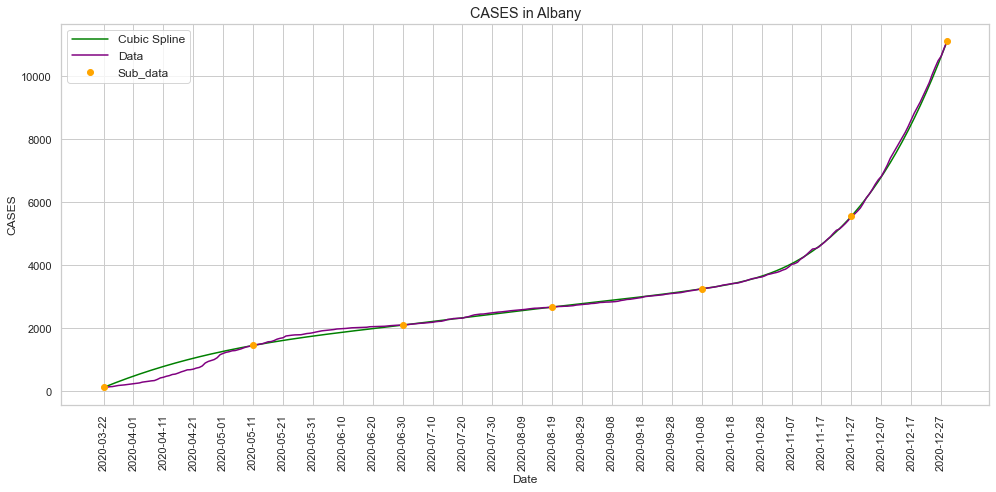

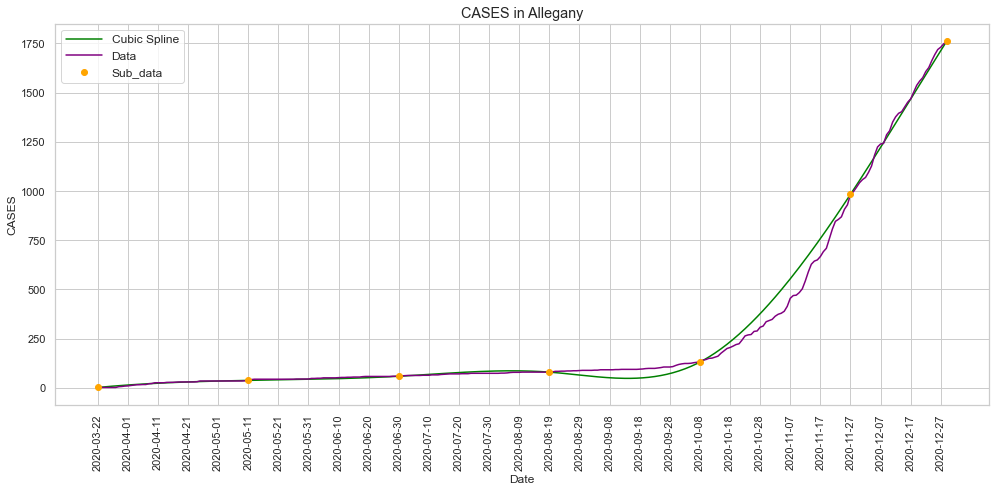

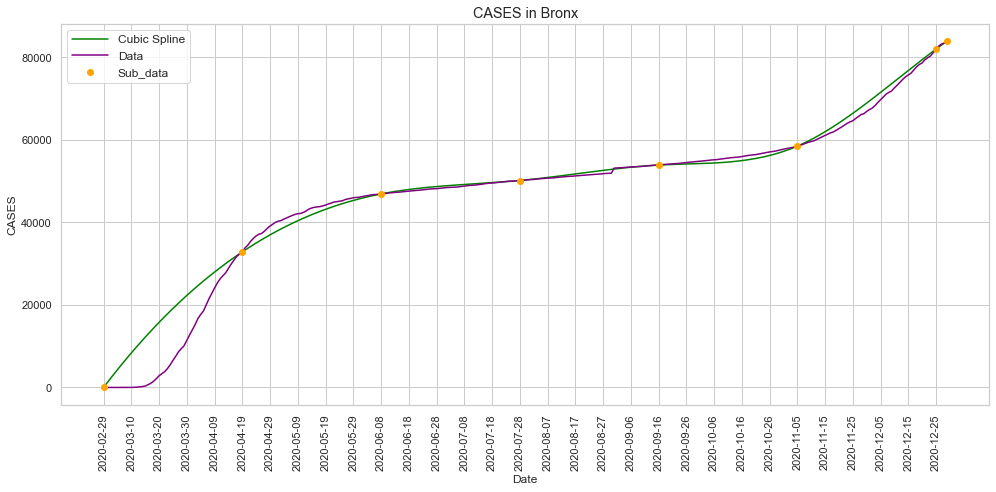

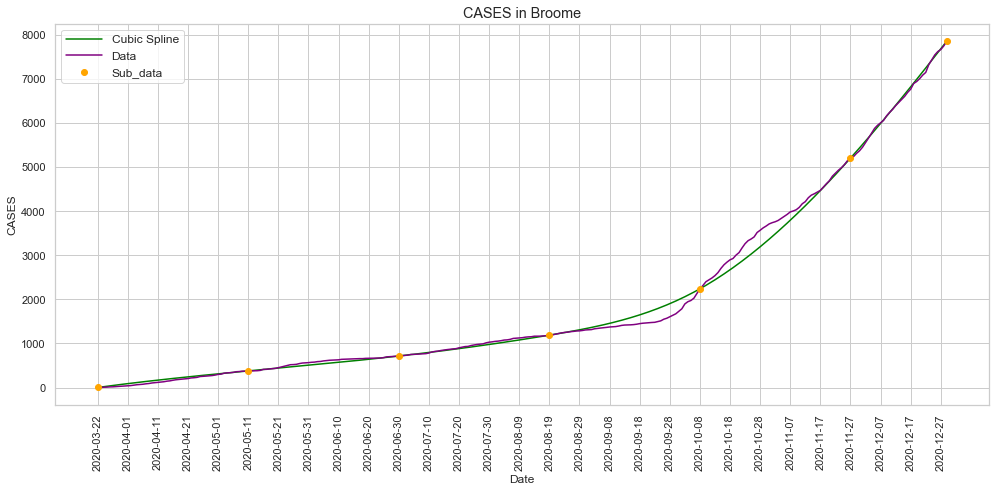

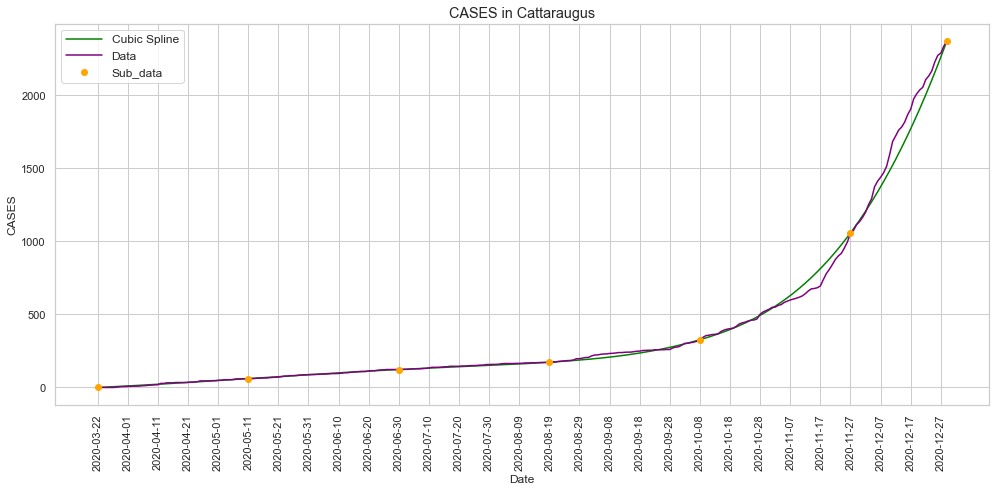

...

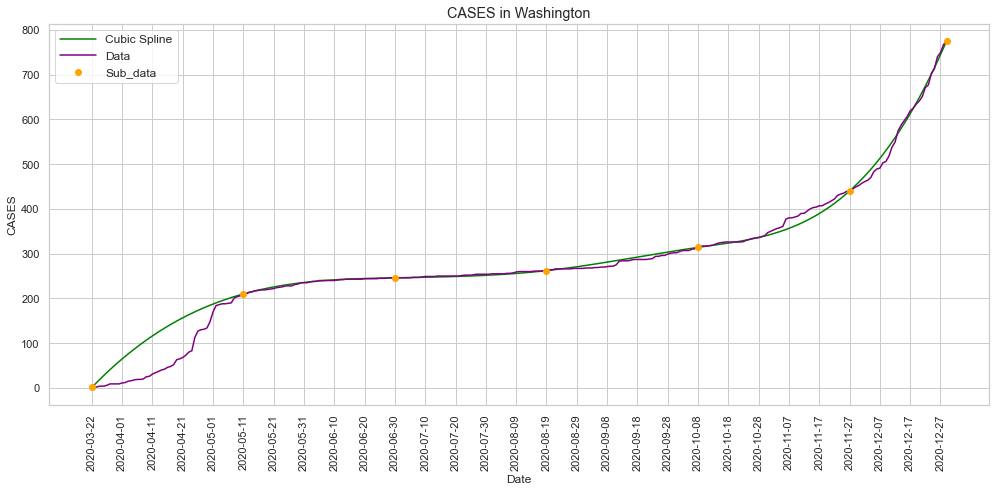

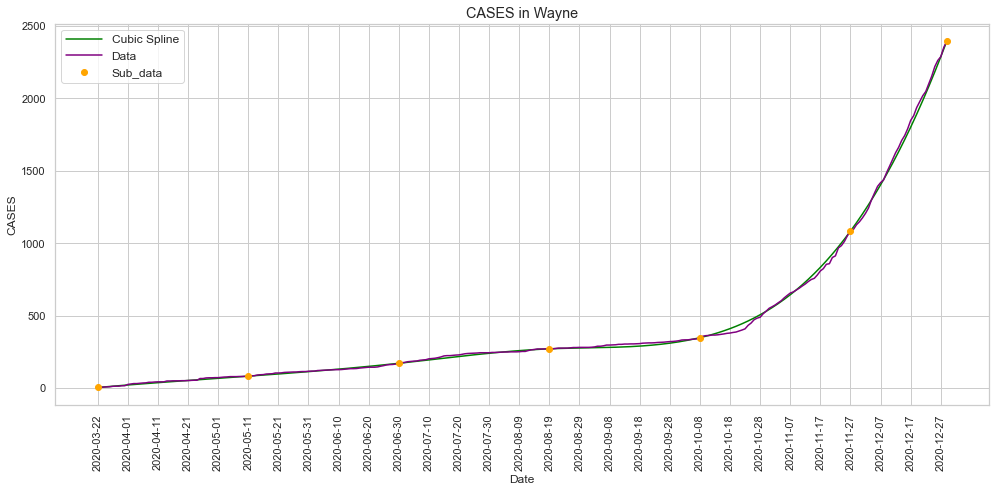

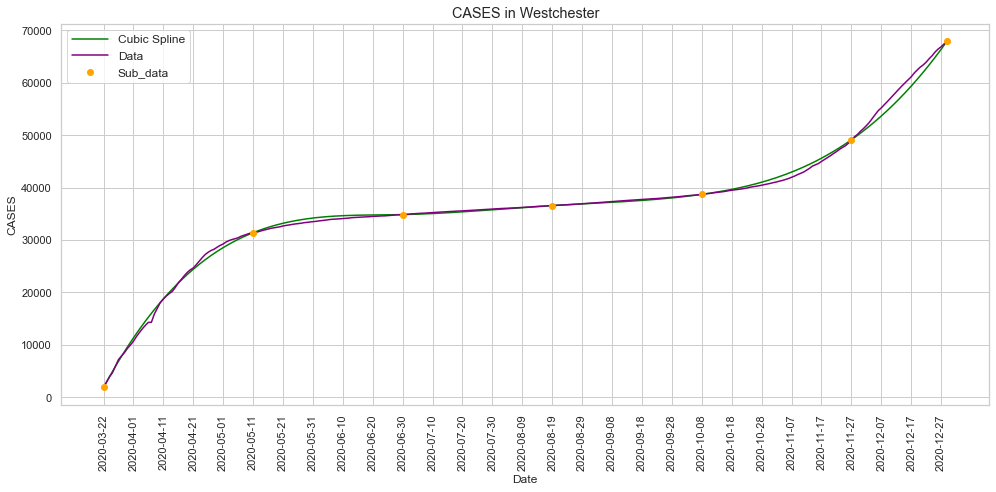

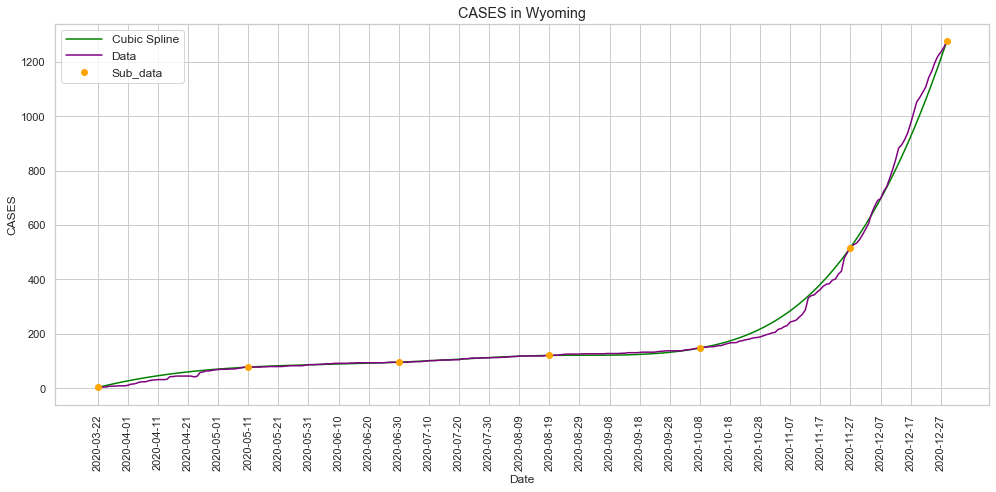

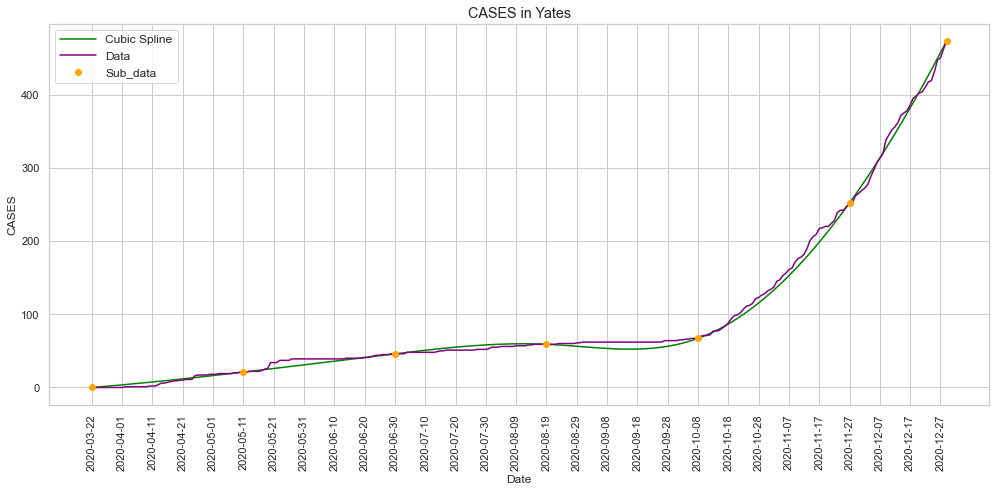

In [55]:
def graphics_cases_sp(data_result_sp,wdw, wdw_d):
    cties = np.unique(data_result_sp['county'].values)
    for cty in cties:
        dat=data_result_sp[data_result_sp.county==cty]
        
        idx = [i for i in range(0,len(dat.index)) if i%wdw==0]
        idx_d = [i for i in range(0,len(dat.index)) if i%wdw_d==0]
        
        if idx[-1]==dat.index[-1]:
            sub_dat = dat.loc[idx]
        else:
            #pdb.set_trace()
            idx.append(dat.index[-1])
            sub_dat=dat.loc[idx]

        if idx_d[-1]==dat.index[-1]:
            sub_dat_d = dat.loc[idx_d]
        else:
            idx_d.append(dat.index[-1])
            sub_dat_d=dat.loc[idx_d]
        
        #pdb.set_trace()
        fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))
        
        countyName=cty
        scale='linear'
        #pdb.set_trace()
        ax.plot(dat['date'], dat['fit_cases_sp'],color='green')
        ax.plot(dat['date'], dat['cases_wthn'],color='purple')
        ax.plot(sub_dat['date'], sub_dat['cases_wthn'],'o',color='orange')
        
        plt.legend(fontsize='medium', labels=['Cubic Spline','Data', 'Sub_data'], handlelength=3.0, loc = 'upper left')
        plt.xticks(dat['date'], rotation='vertical')
        ax.set_xticks(ax.get_xticks()[::10])
        ax.set_yscale(scale)
        ax.set_title(f'CASES in ' + countyName, fontsize='large')
        ax.set_xlabel(f'Date', fontsize='medium')
        ax.set_ylabel(f'CASES', fontsize='medium')
        

graphics_cases_sp(data_result_sp,opt_wdw[0],opt_wdw[1])

C:\Users\abarr\anaconda3\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


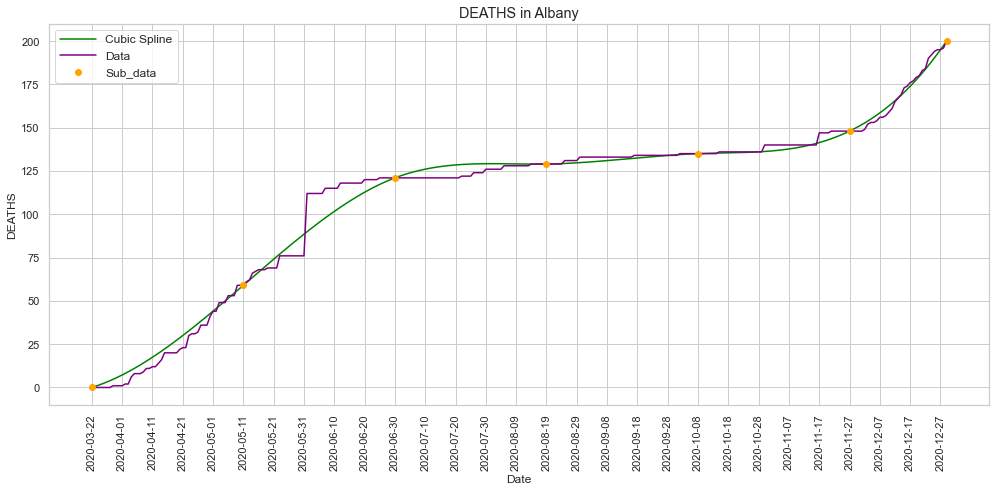

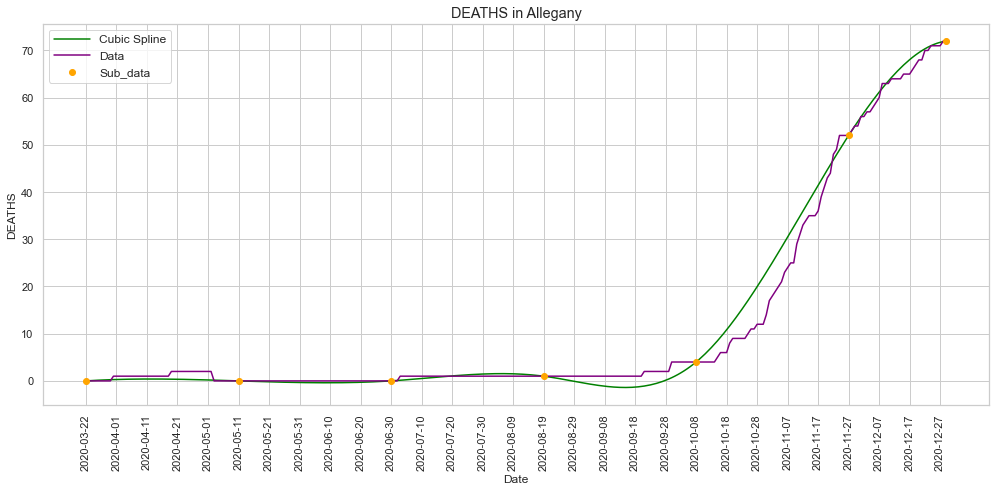

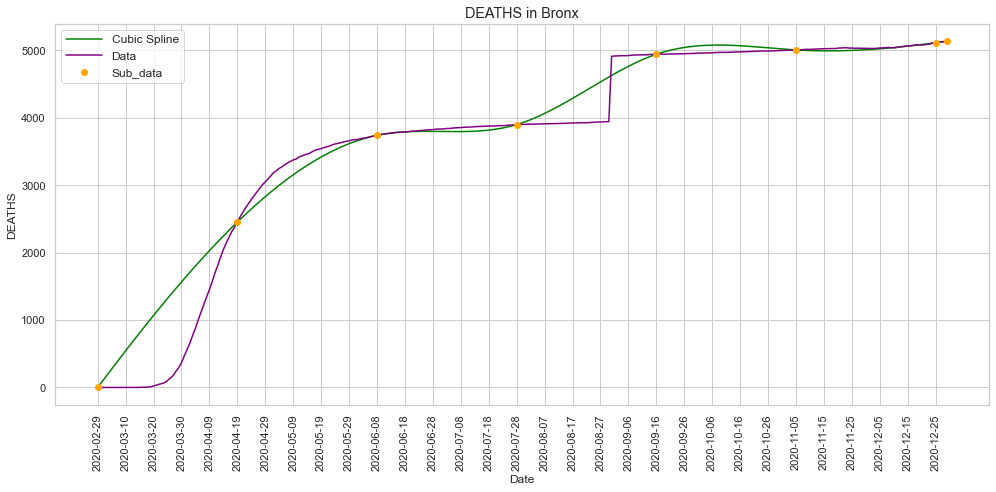

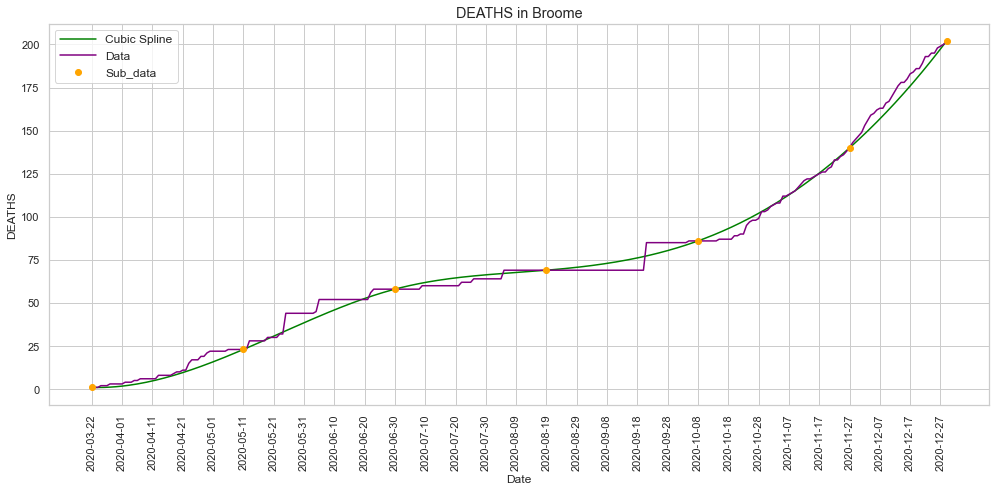

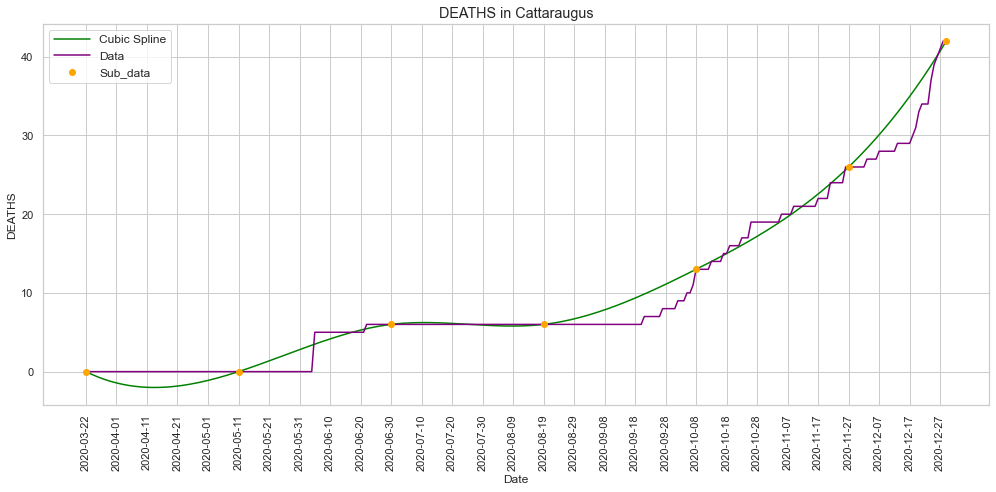

...

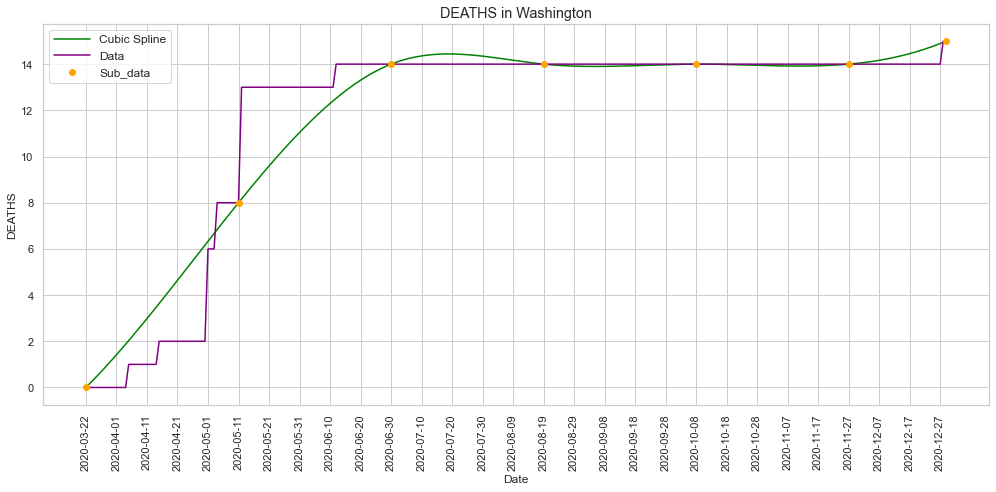

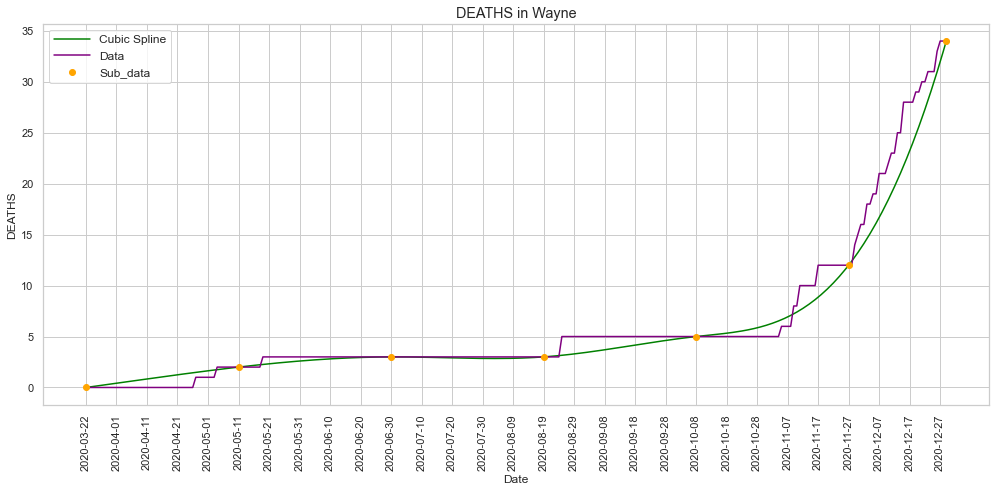

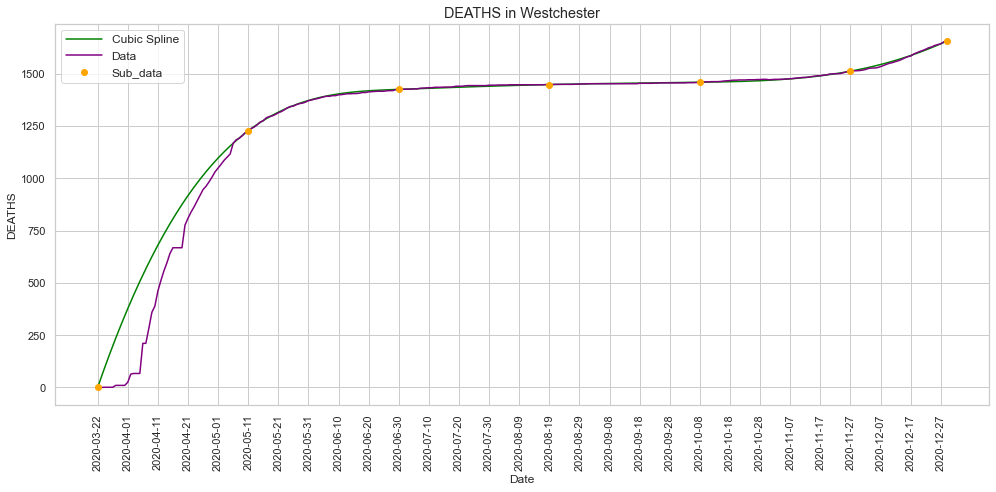

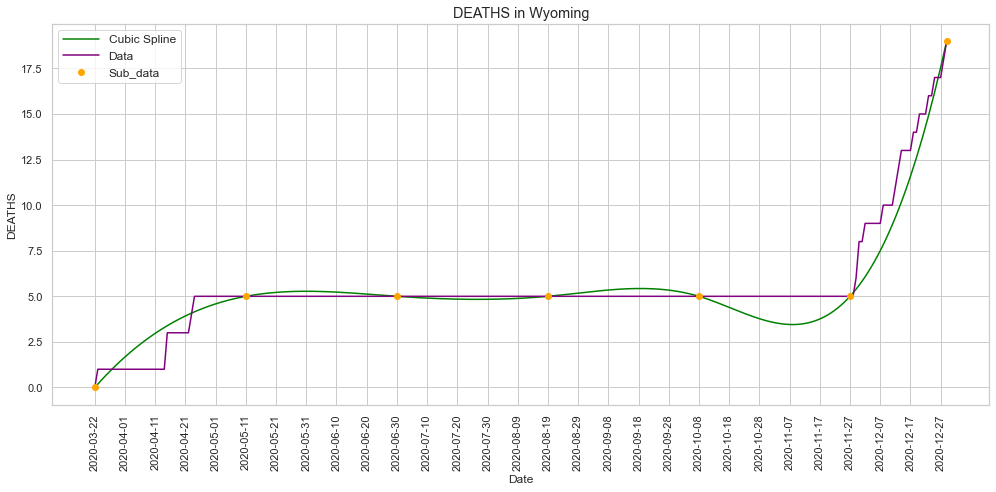

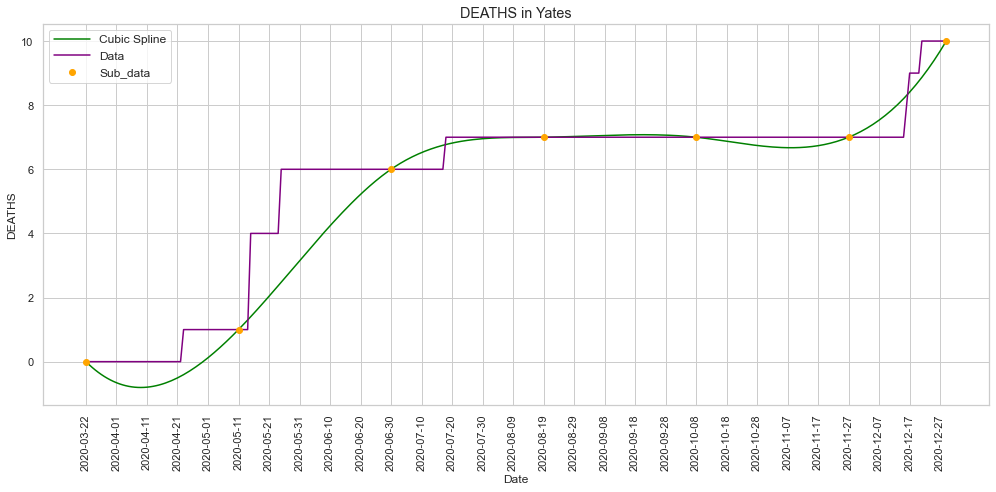

In [42]:
def graphics_deaths_sp(data_result_sp,wdw, wdw_d):
    cties = np.unique(data_result_sp['county'].values)
    for cty in cties:
        dat=data_result_sp[data_result_sp.county==cty]
        
        idx = [i for i in range(0,len(dat.index)) if i%wdw==0]
        idx_d = [i for i in range(0,len(dat.index)) if i%wdw_d==0]
        
        if idx[-1]==dat.index[-1]:
            sub_dat = dat.loc[idx]
        else:
            #pdb.set_trace()
            idx.append(dat.index[-1])
            sub_dat=dat.loc[idx]

        if idx_d[-1]==dat.index[-1]:
            sub_dat_d = dat.loc[idx_d]
        else:
            idx_d.append(dat.index[-1])
            sub_dat_d=dat.loc[idx_d]
        
        #pdb.set_trace()
        fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))
        
        countyName=cty
        scale='linear'
        #pdb.set_trace()
        ax.plot(dat['date'], dat['fit_deaths_sp'],color='green')
        ax.plot(dat['date'], dat['deaths_wthn'],color='purple')
        ax.plot(sub_dat['date'], sub_dat['deaths_wthn'],'o',color='orange')
        
        plt.legend(fontsize='medium', labels=['Cubic Spline','Data', 'Sub_data'], handlelength=3.0, loc = 'upper left')
        plt.xticks(dat['date'], rotation='vertical')
        ax.set_xticks(ax.get_xticks()[::10])
        ax.set_yscale(scale)
        ax.set_title(f'DEATHS in ' + countyName, fontsize='large')
        ax.set_xlabel(f'Date', fontsize='medium')
        ax.set_ylabel(f'DEATHS', fontsize='medium')
        
graphics_deaths_sp(data_result_sp,opt_wdw[0],opt_wdw[1])

In [214]:
data_result_sp

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg,fit_cases_sp,fit_deaths_sp
0,2020-03-22,0.0,Albany,-1.587893,-1.206475,-2.328169,-1.206475,123,0,736.788847,51.471205,123.000000,0.000000
1,2020-03-23,1.0,Albany,-1.585408,-1.193050,-2.328169,-1.193050,127,0,758.391321,52.087199,161.367349,0.562133
2,2020-03-24,2.0,Albany,-1.573601,-1.179665,-2.328169,-1.179665,146,0,779.932020,52.701431,199.158398,1.161131
3,2020-03-25,3.0,Albany,-1.569872,-1.166317,-2.328169,-1.166317,152,0,801.410945,53.313901,236.379301,1.796266
4,2020-03-26,4.0,Albany,-1.558065,-1.153008,-2.328169,-1.153008,171,0,822.828096,53.924611,273.036209,2.466810
...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,2020-12-11,264.0,Yates,3.317021,0.768251,0.633920,0.768251,352,7,141.920702,7.346613,345.041376,6.999532
265,2020-12-12,265.0,Yates,3.365551,0.768861,0.633920,0.768861,356,7,141.970948,7.348186,352.389828,6.999618
266,2020-12-13,266.0,Yates,3.438346,0.769426,0.633920,0.769426,362,7,142.017528,7.349644,359.832365,6.999724
267,2020-12-14,267.0,Yates,3.559670,0.769947,0.633920,0.769947,372,7,142.060443,7.350988,367.369064,6.999851


In [161]:
display(cub_sp_cties)

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg,fit_cases_sp,fit_deaths_sp
0,2020-03-22,0.0,Albany,-1.587893,-1.206475,-2.328169,-1.206475,123,0,736.788847,51.471205,123.000000,0.000000
1,2020-03-23,1.0,Albany,-1.585408,-1.193050,-2.328169,-1.193050,127,0,758.391321,52.087199,138.468198,-1.160417
2,2020-03-24,2.0,Albany,-1.573601,-1.179665,-2.328169,-1.179665,146,0,779.932020,52.701431,152.304264,-2.022948
3,2020-03-25,3.0,Albany,-1.569872,-1.166317,-2.328169,-1.166317,152,0,801.410945,53.313901,164.806231,-2.604572
4,2020-03-26,4.0,Albany,-1.558065,-1.153008,-2.328169,-1.153008,171,0,822.828096,53.924611,176.272132,-2.922268
...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,2020-12-11,264.0,Yates,3.317021,0.768251,0.633920,0.768251,352,7,141.920702,7.346613,348.250038,7.000000
265,2020-12-12,265.0,Yates,3.365551,0.768861,0.633920,0.768861,356,7,141.970948,7.348186,356.000000,7.000000
266,2020-12-13,266.0,Yates,3.438346,0.769426,0.633920,0.769426,362,7,142.017528,7.349644,363.112471,7.000000
267,2020-12-14,267.0,Yates,3.559670,0.769947,0.633920,0.769947,372,7,142.060443,7.350988,369.481217,7.000000


In [44]:
display(E[E.county=='Albany'])

,county,k_cases,Loss_cases,k_deaths,Loss_deaths
0,Albany,2,707835,2,230.862
1,Albany,3,140117,3,64.9486
2,Albany,4,30392.9,4,41.4385
3,Albany,5,10112.2,5,36.1749
4,Albany,6,5116.09,6,19.3363
5,Albany,7,1471.73,7,19.3309
6,Albany,8,1408.17,8,16.7947
7,Albany,9,1348.22,9,15.8528
8,Albany,10,807.802,10,15.6623
9,Albany,11,683.058,11,12.5676


In [ ]:
##### Polynomial least squares method (polyfit interior points)

## Prepare data
dfaux=data_result_sp.copy()
df=dfaux.reset_index()
#dfaux=df.copy()
df = df.drop('index', axis=1)
def LeastSquares(dfaux,g_c,g_d):
    idx = dfaux[dfaux.county=='Unassigned'].index
    dfaux.drop(idx, inplace = True)
    cty=np.unique(dfaux['county'].values)
    interpolations = pd.DataFrame()
    k=0
    print('LEAST SQUARES PROCESSING')
    for cy in cty:
        #print(cy)
        dataux = dfaux[dfaux.county==cy].copy()

        x = dataux['days'].values
        y = dataux['cases_wthn'].values

        y_d = dataux['deaths_wthn'].values

        coeff = np.polyfit(x,y,g_c)
        coeff_d = np.polyfit(x,y_d,g_d)

        p = np.poly1d(coeff)
        p_d = np.poly1d(coeff_d)

        dataux['fit_cases_ls'] = p(x)
        dataux['fit_deaths_ls'] = p_d(x)

        if k==0:
            interpolations = dataux.copy()
            k=k+1
        else:
            interpolations = pd.concat([interpolations, dataux], axis=0)


    return interpolations
    

def error(dfaux,K):
    idx = dfaux[dfaux.county=='Unassigned'].index
    dfaux.drop(idx, inplace = True)
    Error = pd.DataFrame() 
    errores = pd.DataFrame(columns=['county','k_cases','Loss_cases', 'k_deaths', 'Loss_deaths'])
    errores['k_cases']=K
    errores['k_deaths']=K
    u=0
    for county in np.unique(dfaux['county'].values):
        errores['county']=[county]*len(K)
        for i,j in zip(K,K):
            int_df = LeastSquares(dfaux,i,j)
            intdf_by_cty = int_df[int_df.county==county]
            ## cases_wthn, deaths_wthn, fit_cases_ls, fit_deaths_ls
            vec = intdf_by_cty['cases_wthn'].values
            ls = intdf_by_cty['fit_cases_ls'].values
            L = sum((vec-ls)**2)/len(vec)
            errores.loc[errores.k_cases==i, 'Loss_cases'] = L
            
            vec_d = intdf_by_cty['deaths_wthn'].values
            ls_d = intdf_by_cty['fit_deaths_ls'].values
            L_d = sum((vec_d-ls_d)**2)/len(vec_d)
            errores.loc[errores.k_deaths==j, 'Loss_deaths'] = L_d
        
        
        if u == 0:
            Error = errores.copy()
        else:
            Error = pd.concat([Error, errores], axis=0)  
        u=u+1
    
    return Error
    
K=[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]        
E=error(df,K)    

In [ ]:
def ToChoose(E):
    cties = np.unique(E['county'].values)
    Bestdeegre = pd.DataFrame(columns=['county', 'bdeegre_cases', 'bdeegre_deaths']) 
    Bestdeegre['county']=cties
    for cty in cties:
        e_cty = E[E.county==cty]
        bd_cases = e_cty[e_cty.Loss_cases==e_cty['Loss_cases'].min()]['k_cases'].values[0]
        bd_deaths = e_cty[e_cty.Loss_deaths==e_cty['Loss_deaths'].min()]['k_deaths'].values[0]
        Bestdeegre.loc[Bestdeegre.county==cty, 'bdeegre_cases'] = bd_cases
        Bestdeegre.loc[Bestdeegre.county==cty, 'bdeegre_deaths'] = bd_deaths
    
    recurrent_c = Bestdeegre['bdeegre_cases'].mode().values[0]
    recurrent_d = Bestdeegre['bdeegre_deaths'].mode().values[0]
    return recurrent_c, recurrent_d

opt_k = ToChoose(E)
data_result_final = LeastSquares(df,opt_k[0],opt_k[1])
display(data_result_final)


In [46]:
display(opt_k)

(20, 20)

C:\Users\abarr\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


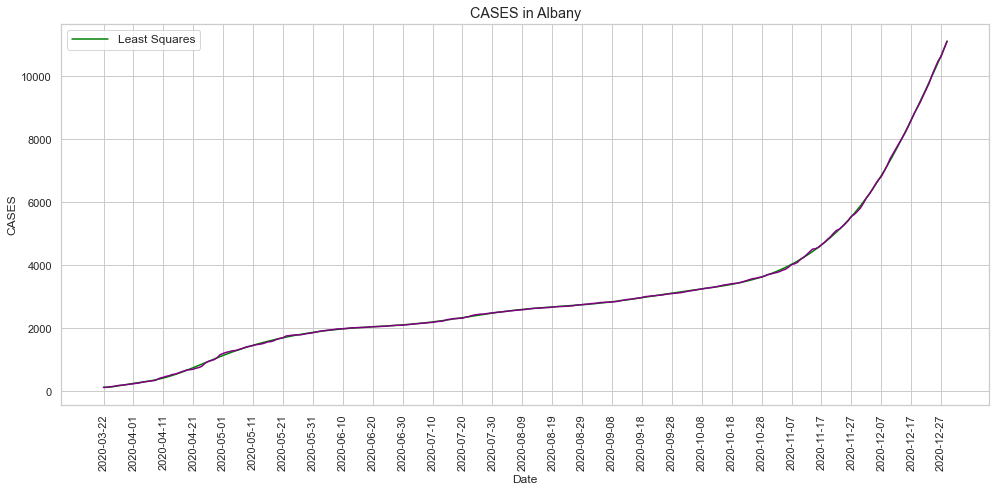

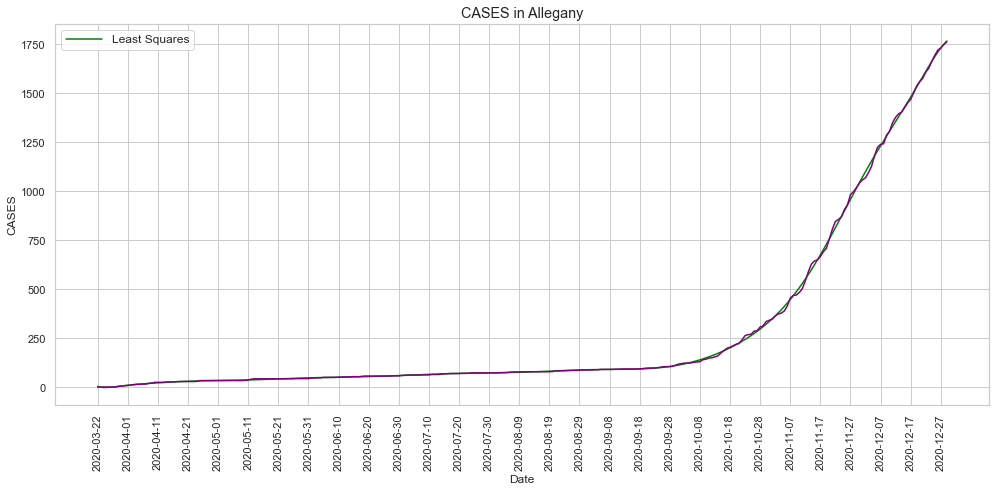

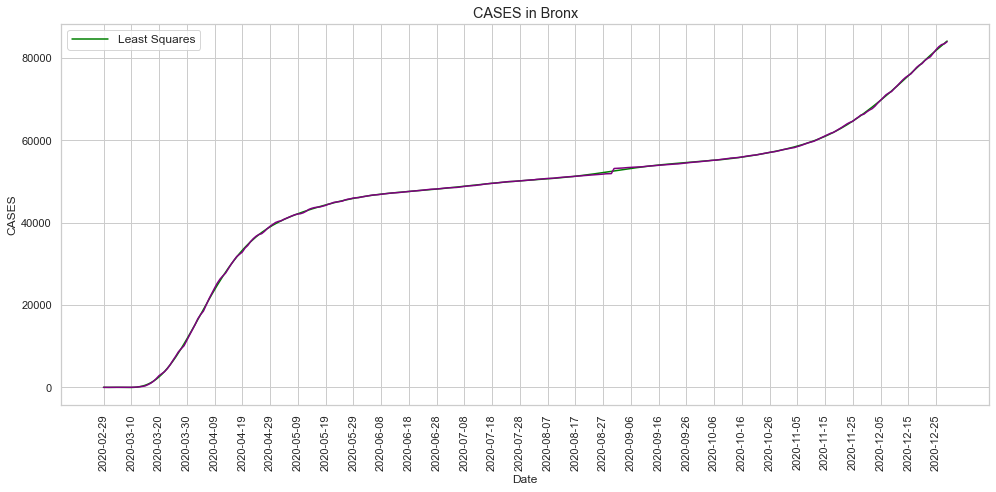

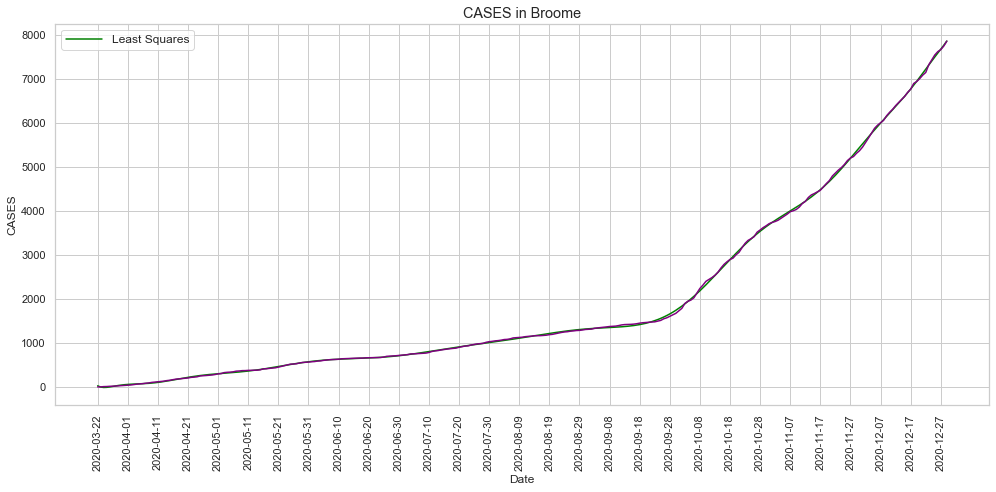

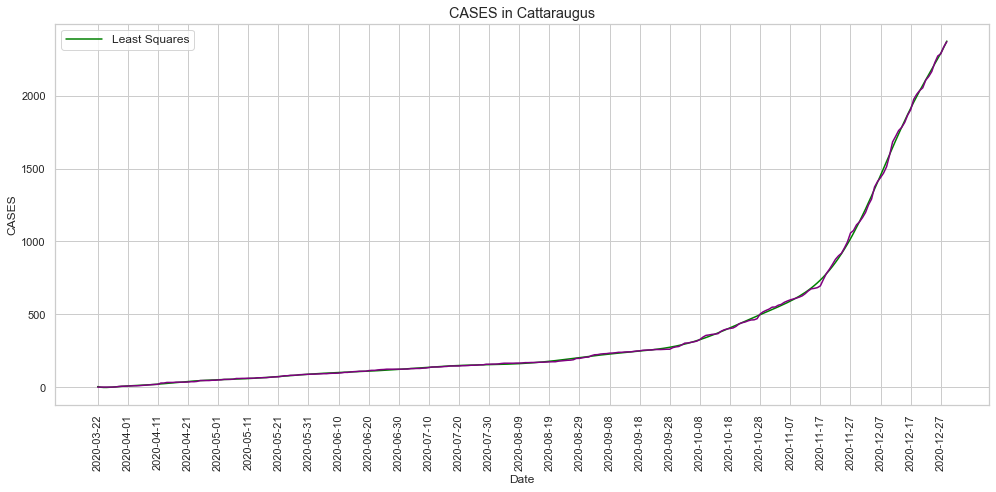

...

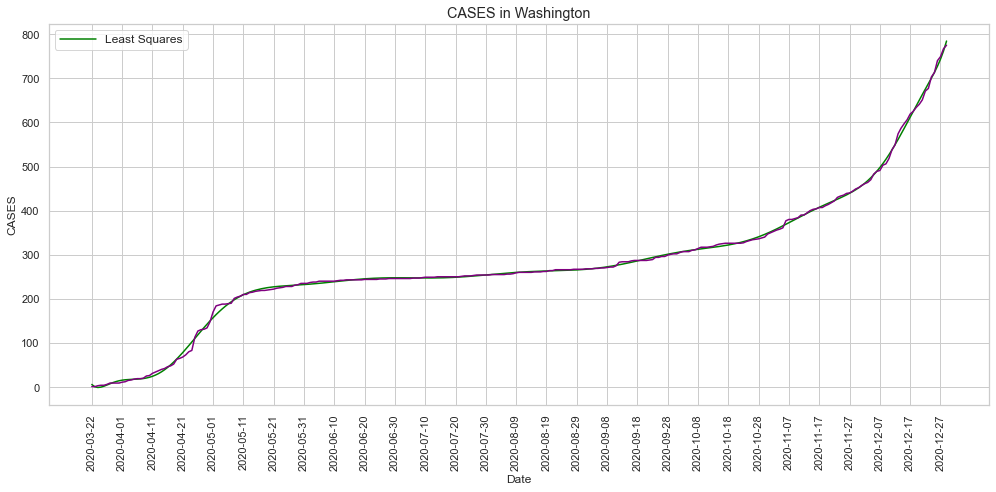

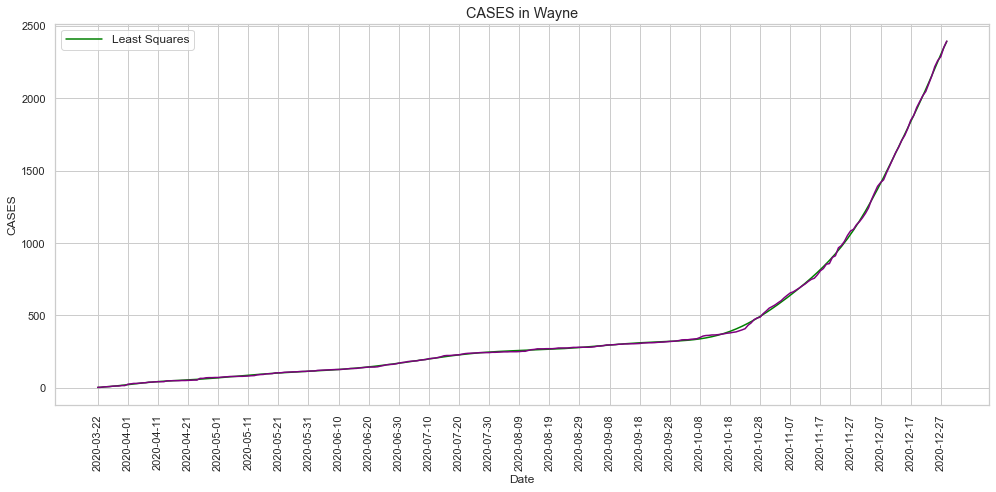

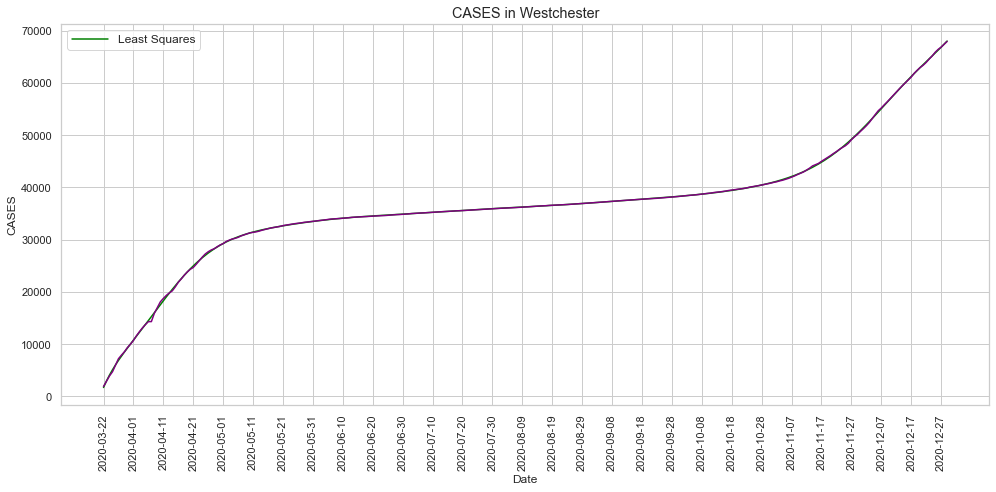

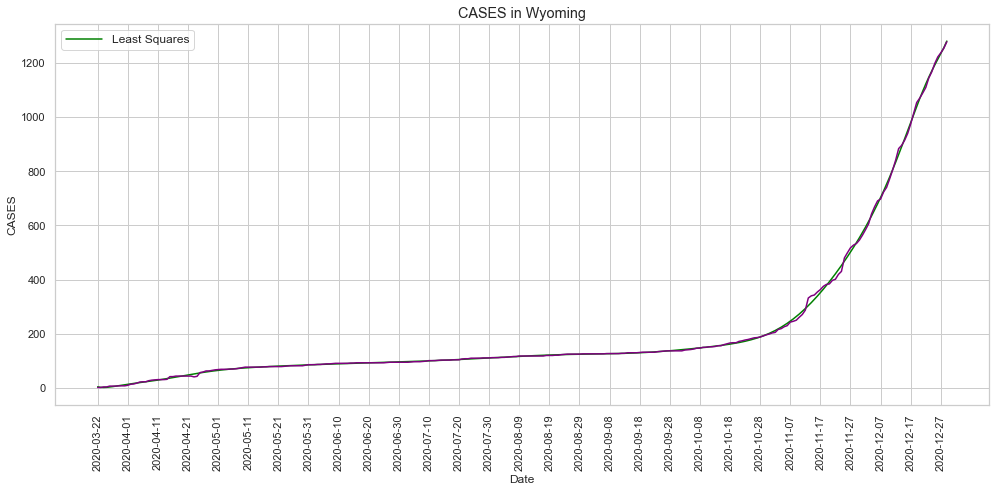

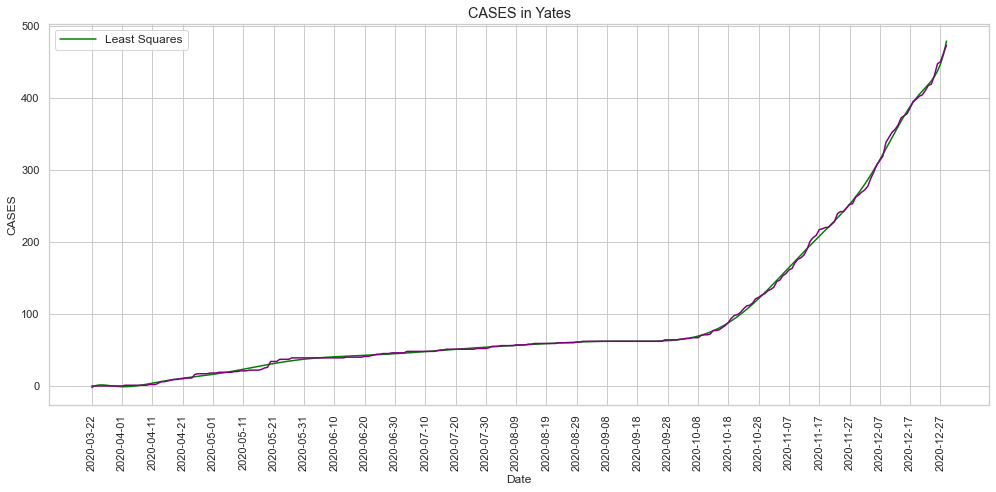

In [48]:
def graphics_cases_ls(data_result_final):
    cties = np.unique(data_result_final['county'].values)
    for cty in cties:
        dat=data_result_final[data_result_final.county==cty]
        
        fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))
        
        countyName=cty
        scale='linear'
        #pdb.set_trace()
        ax.plot(dat['date'], dat['fit_cases_ls'],color='green')
        ax.plot(dat['date'], dat['cases_wthn'],color='purple')
        
        plt.legend(fontsize='medium', labels=['Least Squares'], handlelength=3.0, loc = 'upper left')
        plt.xticks(dat['date'], rotation='vertical')
        ax.set_xticks(ax.get_xticks()[::10])
        ax.set_yscale(scale)
        ax.set_title(f'CASES in ' + countyName, fontsize='large')
        ax.set_xlabel(f'Date', fontsize='medium')
        ax.set_ylabel(f'CASES', fontsize='medium')
        

graphics_cases_ls(data_result_final)

In [222]:
display(data_result_final)

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg,fit_cases_sp,fit_deaths_sp,fit_cases_ls,fit_deaths_ls
0,2020-03-22,0.0,Albany,-1.587893,-1.206475,-2.328169,-1.206475,123,0,736.788847,51.471205,123.000000,0.000000,139.785651,1.378453
1,2020-03-23,1.0,Albany,-1.585408,-1.193050,-2.328169,-1.193050,127,0,758.391321,52.087199,161.367349,0.562133,128.915909,-0.019259
2,2020-03-24,2.0,Albany,-1.573601,-1.179665,-2.328169,-1.179665,146,0,779.932020,52.701431,199.158398,1.161131,131.202276,-0.851645
3,2020-03-25,3.0,Albany,-1.569872,-1.166317,-2.328169,-1.166317,152,0,801.410945,53.313901,236.379301,1.796266,141.718392,-1.190236
4,2020-03-26,4.0,Albany,-1.558065,-1.153008,-2.328169,-1.153008,171,0,822.828096,53.924611,273.036209,2.466810,156.889984,-1.123389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17052,2020-12-11,264.0,Yates,3.317021,0.768251,0.633920,0.768251,352,7,141.920702,7.346613,345.041376,6.999532,351.051470,6.963101
17053,2020-12-12,265.0,Yates,3.365551,0.768861,0.633920,0.768861,356,7,141.970948,7.348186,352.389828,6.999618,359.804380,6.934458
17054,2020-12-13,266.0,Yates,3.438346,0.769426,0.633920,0.769426,362,7,142.017528,7.349644,359.832365,6.999724,367.017843,6.926837
17055,2020-12-14,267.0,Yates,3.559670,0.769947,0.633920,0.769947,372,7,142.060443,7.350988,367.369064,6.999851,371.718164,6.965932


C:\Users\abarr\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


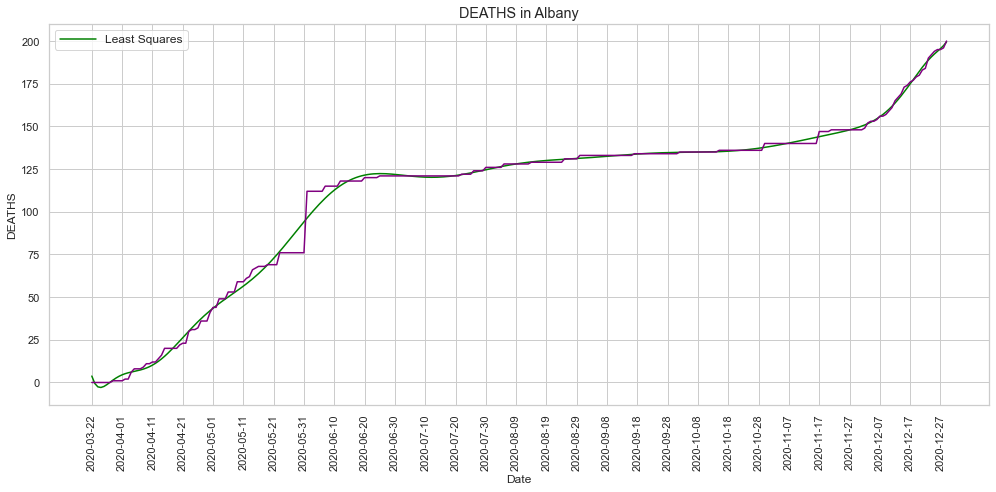

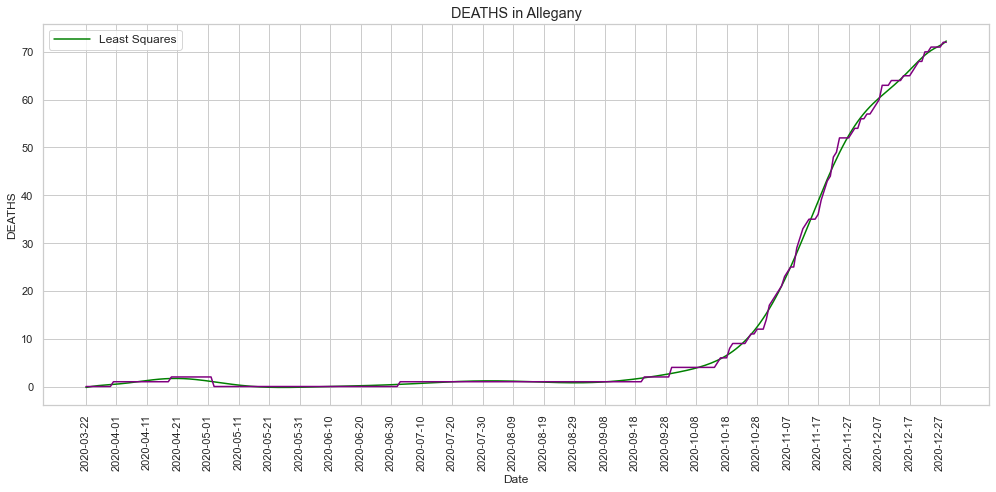

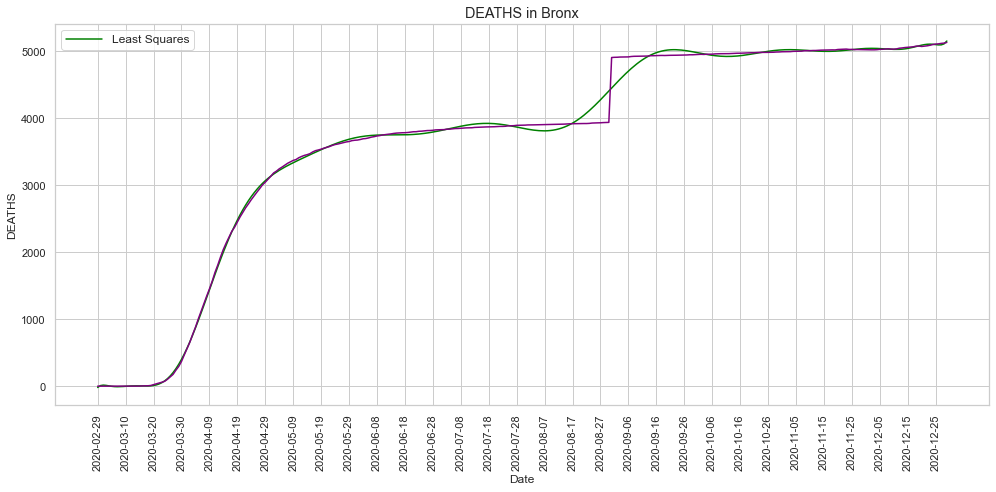

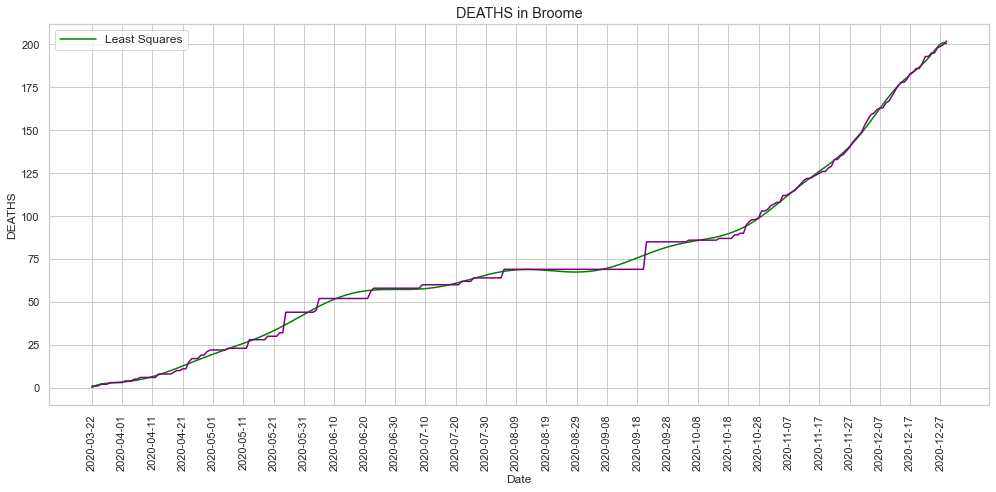

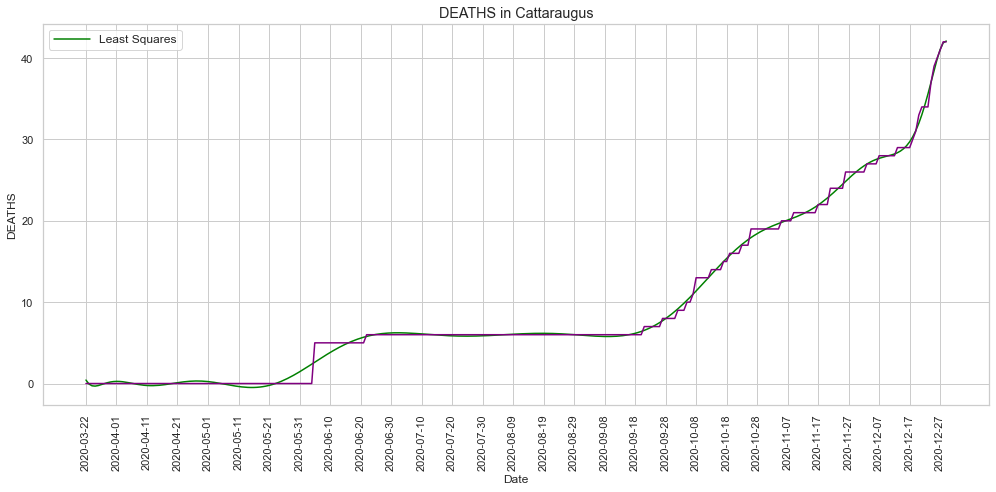

...

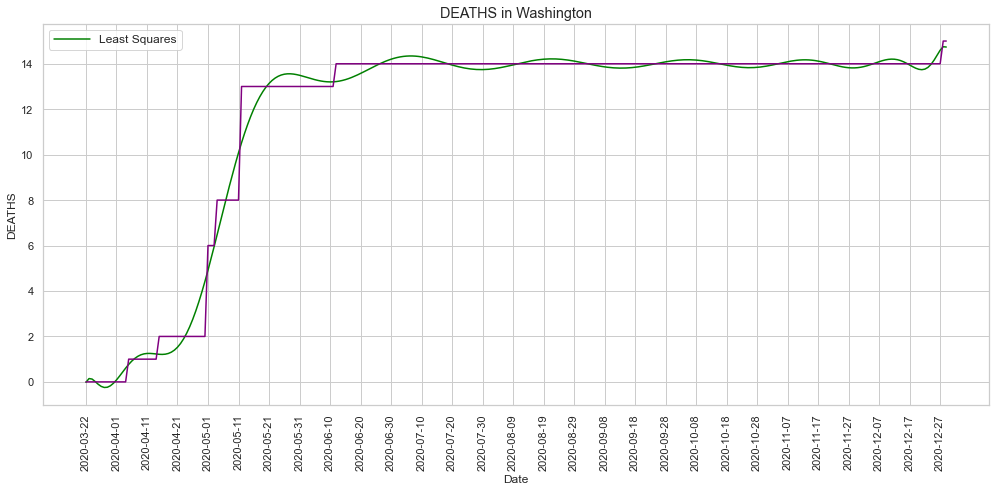

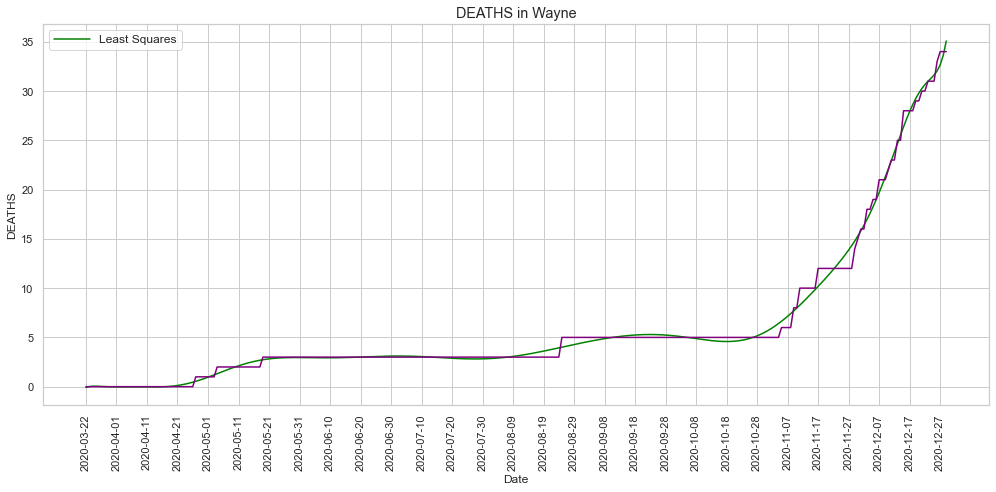

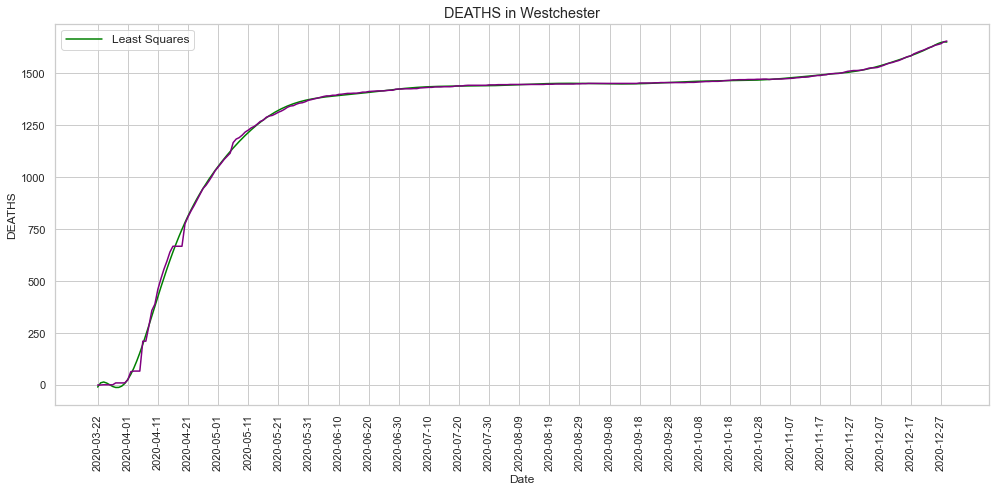

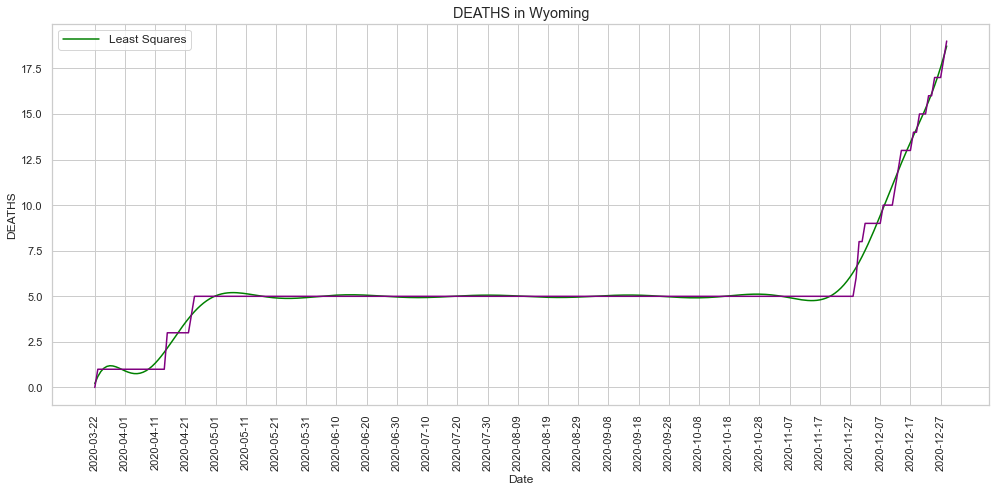

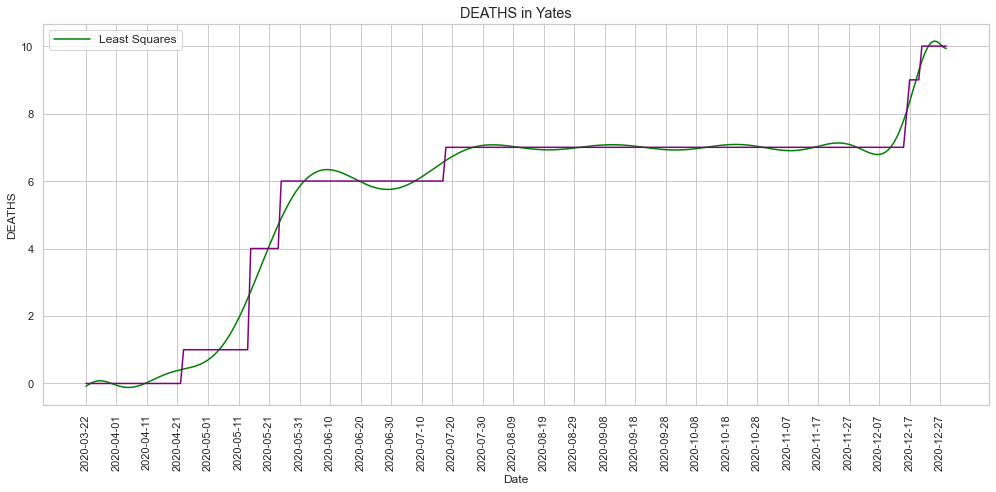

In [49]:
def graphics_deaths_ls(data_result_final):
    cties = np.unique(data_result_final['county'].values)
    for cty in cties:
        dat=data_result_final[data_result_final.county==cty]
        
        fig, ax = plt.subplots(tight_layout=True,figsize=(14,7))
        
        countyName=cty
        scale='linear'
        #pdb.set_trace()
        ax.plot(dat['date'], dat['fit_deaths_ls'],color='green')
        ax.plot(dat['date'], dat['deaths_wthn'],color='purple')
        
        plt.legend(fontsize='medium', labels=['Least Squares'], handlelength=3.0, loc = 'upper left')
        plt.xticks(dat['date'], rotation='vertical')
        ax.set_xticks(ax.get_xticks()[::10])
        ax.set_yscale(scale)
        ax.set_title(f'DEATHS in ' + countyName, fontsize='large')
        ax.set_xlabel(f'Date', fontsize='medium')
        ax.set_ylabel(f'DEATHS', fontsize='medium')
        

graphics_deaths_ls(data_result_final)

In [53]:
#display(data_result_final)
#### debugging the data_result database. 
## Eliminate negative values. 
def DebuggingData(data):
    cties = np.unique(data['county'].values)
    Result = pd.DataFrame()
    k=0
    for cty in cties:
        auxdf = data[data.county==cty].copy()
        #pdb.set_trace()
        if len(auxdf[auxdf.fit_cases_Oreg < 0])>0:
            last0_idx = auxdf[auxdf.fit_cases_Oreg < 0].index[-1]
            auxdf.loc[0:last0_idx, 'fit_cases_Oreg'] = 0
        elif len(auxdf[auxdf.fit_deaths_Oreg < 0]) > 0:
            last1_idx = auxdf[auxdf.fit_deaths_Oreg < 0].index[-1]
            auxdf.loc[0:last1_idx, 'fit_deaths_Oreg'] = 0
        elif len(auxdf[auxdf.fit_cases_sp < 0]) > 0:
            last2_idx = auxdf[auxdf.fit_cases_sp < 0].index[-1]
            auxdf.loc[0:last2_idx, 'fit_cases_sp'] = 0
        elif len(auxdf[auxdf.fit_deaths_sp < 0]) > 0:
            last3_idx = auxdf[auxdf.fit_deaths_sp < 0].index[-1]
            auxdf.loc[0:last3_idx, 'fit_deaths_sp'] = 0
        elif len(auxdf[auxdf.fit_cases_ls < 0]) > 0:
            #pdb.set_trace()
            last4_idx = auxdf[auxdf.fit_cases_ls < 0].index[-1]
            auxdf.loc[0:last4_idx, 'fit_cases_ls'] = 0
        elif len(auxdf[auxdf.fit_deaths_ls < 0]) > 0:
            #pdb.set_trace()
            last5_idx = auxdf[auxdf.fit_deaths_ls < 0].index[-1]
            auxdf.loc[0:last5_idx, 'fit_deaths_ls'] = 0
        
        if k==0:
            Result = auxdf.copy()
        else:
            Result = pd.concat([Result, auxdf], axis=0)
        k=k+1
    
    return Result

data=data_result_final.copy()
Result = DebuggingData(data)    
display(Result)

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg,fit_cases_sp,fit_deaths_sp,fit_cases_ls,fit_deaths_ls
0,2020-03-22,0.0,Albany,-1.319872,-0.871382,-2.306959,-0.871382,123,0,1109.779346,68.941278,123.000000,0.000000,133.837711,0.000000
1,2020-03-23,1.0,Albany,-1.318054,-0.864919,-2.306959,-0.864919,127,0,1123.998189,69.251626,161.442441,0.563828,129.790892,0.000000
2,2020-03-24,2.0,Albany,-1.309419,-0.858448,-2.306959,-0.858448,146,0,1138.236045,69.562390,199.304030,1.164417,135.022647,0.000000
3,2020-03-25,3.0,Albany,-1.306692,-0.851969,-2.306959,-0.851969,152,0,1152.492915,69.873569,236.591015,1.801043,146.050040,0.000000
4,2020-03-26,4.0,Albany,-1.298056,-0.845480,-2.306959,-0.845480,171,0,1166.768798,70.185163,273.309641,2.472979,160.349890,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17934,2020-12-25,278.0,Yates,3.065953,0.978820,1.652145,0.978820,431,10,202.582362,8.195566,441.509265,9.396400,429.408316,10.150341
17935,2020-12-26,279.0,Yates,3.212150,0.983193,1.652145,0.983193,447,10,203.060923,8.207284,449.283517,9.540176,436.862772,10.130465
17936,2020-12-27,280.0,Yates,3.239562,0.987549,1.652145,0.987549,450,10,203.537601,8.218957,457.123625,9.688655,446.753669,10.057625
17937,2020-12-28,281.0,Yates,3.349210,0.991887,1.652145,0.991887,462,10,204.012397,8.230583,465.029237,9.841906,460.215393,9.968343


In [55]:
Regpoly_CuSpline_LeSquares=Result.copy()
#C:\Users\abarr\Documents\GitHub\PoC-NY-data\output\Hybridata
Regpoly_CuSpline_LeSquares.to_csv('C:/Users/abarr/Documents/GitHub/PoC-NY-data/output/Hybridata/HybridData_Regpoly_Cuspline_LeSquares_epidemiology_NYCties_std.csv', index= False)

In [61]:
display(Result)

,date,days,county,cases,fit_cases_Zreg,deaths,fit_deaths_Zreg,cases_wthn,deaths_wthn,fit_cases_Oreg,fit_deaths_Oreg,fit_cases_sp,fit_deaths_sp,fit_cases_ls,fit_deaths_ls
0,2020-03-22,0.0,Albany,-1.319872,-0.871382,-2.306959,-0.871382,123,0,1109.779346,68.941278,123.000000,0.000000,133.837711,0.000000
1,2020-03-23,1.0,Albany,-1.318054,-0.864919,-2.306959,-0.864919,127,0,1123.998189,69.251626,161.442441,0.563828,129.790892,0.000000
2,2020-03-24,2.0,Albany,-1.309419,-0.858448,-2.306959,-0.858448,146,0,1138.236045,69.562390,199.304030,1.164417,135.022647,0.000000
3,2020-03-25,3.0,Albany,-1.306692,-0.851969,-2.306959,-0.851969,152,0,1152.492915,69.873569,236.591015,1.801043,146.050040,0.000000
4,2020-03-26,4.0,Albany,-1.298056,-0.845480,-2.306959,-0.845480,171,0,1166.768798,70.185163,273.309641,2.472979,160.349890,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17934,2020-12-25,278.0,Yates,3.065953,0.978820,1.652145,0.978820,431,10,202.582362,8.195566,441.509265,9.396400,429.408316,10.150341
17935,2020-12-26,279.0,Yates,3.212150,0.983193,1.652145,0.983193,447,10,203.060923,8.207284,449.283517,9.540176,436.862772,10.130465
17936,2020-12-27,280.0,Yates,3.239562,0.987549,1.652145,0.987549,450,10,203.537601,8.218957,457.123625,9.688655,446.753669,10.057625
17937,2020-12-28,281.0,Yates,3.349210,0.991887,1.652145,0.991887,462,10,204.012397,8.230583,465.029237,9.841906,460.215393,9.968343


In [62]:
Result.columns

Index(['date', 'days', 'county', 'cases', 'fit_cases_Zreg', 'deaths',
       'fit_deaths_Zreg', 'cases_wthn', 'deaths_wthn', 'fit_cases_Oreg',
       'fit_deaths_Oreg', 'fit_cases_sp', 'fit_deaths_sp', 'fit_cases_ls',
       'fit_deaths_ls'],
      dtype='object')